# CAPSTONE PROJECT - NYC TLC Trip Record

Oktandre Boy
JCDS 0408 - 04

---

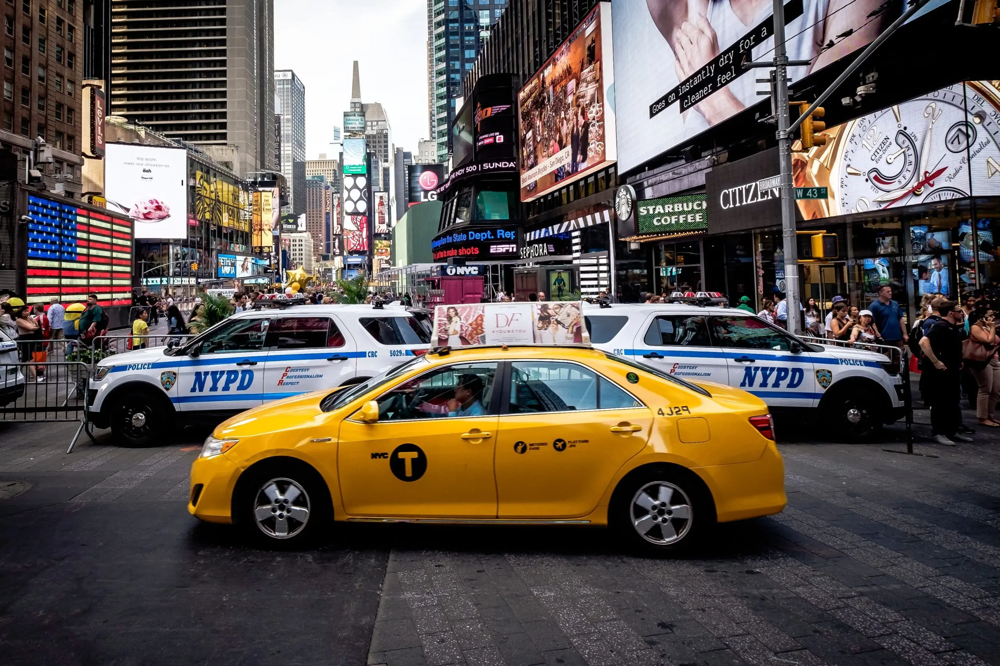

# 1. Pendahuluan

Pada project Capstone module 2 ini mendapatkan sebuah dataset yang bernama NYC TLC Trip Record.CSV, data tersebut memuat informasi tentang aspek perjalanan perusahaan taksi dan *limousin* di kota *New York*, data tersebut akan dilakukan *cleaning*, analisis serta akan disimpulkan berbagai permasalahan yang akan dirumuskan oleh pribadi sehingga dapat mendapatkan berbagai informasi data perjalanan serta rekomendasi dari analisis yang akan di kepada *stakeholder*.

### 1.1 Bussiness Understanding

Komisi Taksi dan *Limousin* Kota *New York* *(New York City Taxi and Limousine Commission)* adalah sebuah perusahaan / badan yang dibawahi oleh pemerintahan kota *New York* di Amerika Serikat yang mencakup industri sewa kendaraan, mengatur serta memfasilitasi Taksi serta / *Limousin* yang bisa digunakan baik untuk warga kota atau wisatawan kota *New York*.

TLC sendiri didirikan pada tahun 1971 oleh *John Lindsay* walikota yang menjabat pada periode tersebut. Perusahaan ini didirikan dengan tujuan untuk memajukan transportasi antar kota.

Pada saat ini, menurut laporan perusahaan TLC telah memberi sekitar 170.000 lisensi kepada driver profesional, selain itu perusashaan ini memberi linsensi kepada sekitar 100.000 lebih kendaraan dan memiliki kurang lebih 1000 pangkalan sewa kendaraan yang tersebar di setiap sudut kota *New York*. 

Salah satu ciri khas dari taksi ini adalah warnanya yang mencolok berwarna kuning, ini sudah menjadi ciri khas atau ikon kota *New York*, dan sering dijumpai di beberapa film yang berlatar *di New York* , terkenal seperti *Home Alone*, *Baby's Day Out*, *Taxi Driver* dan *The Irishman*.



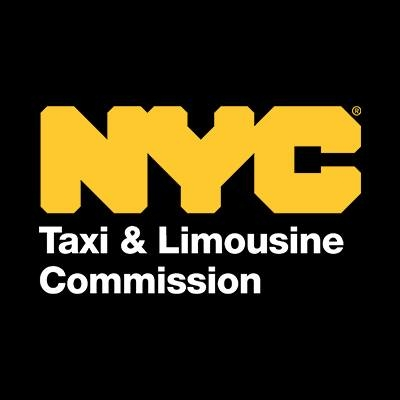

### 1.2 Rumusan Masalah

**Problem Statement**

Pada Project kali ini akan menginditifikasi sebuah jasa sewa perusahaan taxi, hal-hal utama yang harus diperhatikan adalah pola perjalanannya, seperti peak hours, rute yang paling banyak menggunakan jasa, peningkatan demand, serta pemberian tip atas jasa driver, selain itu juga dapat melihat preferensi pelanggan terhadap pembayaran serta rute perjalanan.

**Goals**

1. Mengetahui preferensi pelanggan terhadap kebutuhan pribadi (kecenderungan mayoritas penduduk New York).
2. Mengidentifikasi apa saja hal-hal atau faktor yang membuat pelanggan memberikan tip kepada driver.
3. Menganalisa area mana saja yang paling banyak menggunakan jasa sehingga kedepannya dapat menentukan rute serta kebutuhan armada setiap area tertentu.

In [2607]:
# Import Libraries
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import normaltest

import warnings 
warnings.filterwarnings("ignore")


In [2608]:
df = pd.read_csv("NYC_TLC_Trip Record.csv", parse_dates=['lpep_pickup_datetime', 'lpep_dropoff_datetime'])
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.90,1.0,0.5,4.03,0.0,NaN,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.70,1.0,0.5,2.64,0.0,NaN,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.20,1.0,0.5,1.94,0.0,NaN,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.50,0.5,1.5,1.70,0.0,NaN,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.00,0.5,1.5,0.00,0.0,NaN,1.0,8.00,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,NaN,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,NaN,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,NaN,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,NaN,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,NaN,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,NaN,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,NaN,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,NaN,1.0,19.18,NaN,NaN,NaN


In [2609]:
df_zone = pd.read_csv("taxi_zone_lookup.csv")
df_zone

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone
...,...,...,...,...
260,261,Manhattan,World Trade Center,Yellow Zone
261,262,Manhattan,Yorkville East,Yellow Zone
262,263,Manhattan,Yorkville West,Yellow Zone
263,264,Unknown,NV,NaN


In [2610]:
df_loc = df_zone.copy()
df_loc.fillna('Unknown', inplace=True)
df_loc.tail()

,LocationID,Borough,Zone,service_zone
260,261,Manhattan,World Trade Center,Yellow Zone
261,262,Manhattan,Yorkville East,Yellow Zone
262,263,Manhattan,Yorkville West,Yellow Zone
263,264,Unknown,NV,Unknown
264,265,Unknown,Unknown,Unknown


In [2611]:
df = pd.merge(df, df_loc.add_prefix('PU'), left_on="PULocationID", right_on="PULocationID", how="left")
df = pd.merge(df, df_loc.add_prefix('DO'), left_on="DOLocationID", right_on="DOLocationID", how="left")
print('Total data: ', len(df))
df.head()

Total data:  68211


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,total_amount,payment_type,trip_type,congestion_surcharge,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,...,24.18,1.0,1.0,2.75,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,...,15.84,1.0,1.0,0.00,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,...,11.64,1.0,1.0,0.00,Queens,Steinway,Boro Zone,Queens,Old Astoria,Boro Zone
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,...,10.20,1.0,1.0,0.00,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,...,8.00,1.0,1.0,0.00,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone


In [2612]:
# Menampilkan informasi dataset
print(f'Jumlah Kolom : {len(df.columns)}\nJumlah Baris : {len(df)}')
print('Jenis data   : ')
display(pd.DataFrame(df.dtypes, columns=['Tipe Data']))

Jumlah Kolom : 26
Jumlah Baris : 68211
Jenis data   : 


,Tipe Data
VendorID,int64
lpep_pickup_datetime,datetime64[ns]
lpep_dropoff_datetime,datetime64[ns]
store_and_fwd_flag,object
RatecodeID,float64
PULocationID,int64
DOLocationID,int64
passenger_count,float64
trip_distance,float64
fare_amount,float64


In [2613]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68211 entries, 0 to 68210
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   VendorID               68211 non-null  int64         
 1   lpep_pickup_datetime   68211 non-null  datetime64[ns]
 2   lpep_dropoff_datetime  68211 non-null  datetime64[ns]
 3   store_and_fwd_flag     63887 non-null  object        
 4   RatecodeID             63887 non-null  float64       
 5   PULocationID           68211 non-null  int64         
 6   DOLocationID           68211 non-null  int64         
 7   passenger_count        63887 non-null  float64       
 8   trip_distance          68211 non-null  float64       
 9   fare_amount            68211 non-null  float64       
 10  extra                  68211 non-null  float64       
 11  mta_tax                68211 non-null  float64       
 12  tip_amount             68211 non-null  float64       
 13  t

Dataset diatas telah dimerge dengan data support yang berisikan kolom-kolom nama area di kota New York untuk kebutuhan analisis.

---

# 2. Data Understanding

### 2.1 Keterangan dan Informasi Kolom

Dataset 'NYC_TLC_Trip Record.csv' memiliki 20 kolom yang memiliki keterangan seperti berikut:

| No. | Nama Kolom | Jenis | Penjelasan|
| ----| ---------- | ---------------- | --------------|
|1|VendorID|Numerikal|ID penyedia taksi yang biasanya berupa kode numerik yang mewakili perusahaan taksi|
|2|lpep_pickup_datetime|Date|Tanggal dan waktu ketika perjalanan dimulai|
|3|lpep_dropoff_datetime|Date|Tanggal dan waktu ketika perjalanan berakhir|
|4|store_and_fwd_flag|Kategorikal| Indikator apakah data perjalanan disimpan|
|5|RatecodeID|Kategorikal|Kode tarif yang menunjukkan jenis tarif yang digunakan untuk perjalanan tersebut|
|6|PULocationID|Kategorikal|ID lokasi penjemputan yang diwakili oleh kode numerik|
|7|DOLocationID|Kategorikal|ID lokasi penurunan yang diwakili oleh kode numerik|
|8|passenger_count|Numerikal|Jumlah penumpang dalam perjalanan tersebut|
|9|trip_distance|Numerikal|Jarak perjalanan dalam mil|
|10|fare_amount|Numerikal|Jumlah tarif dasar perjalanan|
|11|extra|Numerikal|Biaya tambahan yang mungkin termasuk biaya malam hari, biaya jam sibuk, dll|
|12|mta_tax|Numerikal|Pajak Transportasi umum|
|13|tip_amount|Numerikal|Jumlah tip yang diberikan oleh penumpang|
|14|tolls_amount|Numerikal|Biaya perjalanan via jalan Toll|
|15|ehail_fee|Null|Null|
|16|improvement_surcharge|Kategorikal|Biaya tambahan identik dengan biaya ekstra|
|17|total_amount|Numerikal|Jumlah |
|18|payment_type|Kategorikal|Cara pembayaran, contoh tipe 1 = Credit Card dan tipe 2 = Cash|
|19|trip_type|Kategorikal|Tipe perjalanan, contoh tipe 1 = perjalanan standar dan tipe = perjalanan dengan tambahan tertentu|
|20|congestion_surcharge|Numerikal|Biaya kemacetan|


In [2614]:
# Menampilkan informasi dataset
print(f'Jumlah Kolom : {len(df.columns)}\nJumlah Baris : {len(df)}')


Jumlah Kolom : 26
Jumlah Baris : 68211


### 2.2 Tipe data setiap kolom

Berikut adalah Tipe setiap kolomnya:

In [2615]:
display(pd.DataFrame(df.dtypes, columns=['Tipe Data']))

,Tipe Data
VendorID,int64
lpep_pickup_datetime,datetime64[ns]
lpep_dropoff_datetime,datetime64[ns]
store_and_fwd_flag,object
RatecodeID,float64
PULocationID,int64
DOLocationID,int64
passenger_count,float64
trip_distance,float64
fare_amount,float64


### 2.3 Rangkuman duplicate values, negative and null values serta unique values pada setiap kolom

Dari setiap kolom yang telah ditentukan tipe datanya, selanjutnya perlu dilakukan pengecekan nilai yang memiliki duplikat, dalam dataset tersebut terdapat nilai yang null dan beberapa data bernilai negatif (-) perlu juga dilakukan pengecekan terhadap nilai unique disetiap kolomnya untuk mengetahui berapa jumlah serta persentasenya, dengan rangkuman sebagai berikut.

In [2616]:
pd.DataFrame({
    'feature': df.columns.values,
    'null_value(%)': df.isna().mean().values * 100,
    'negative_value(%)': [len(df[col][df[col] < 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],
    '0_value(%)': [len(df[col][df[col] == 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],
    'duplicate_values' : df.duplicated().sum(),
    'n_unique': df.nunique().values,
    'unique_values_sample': [df[col].unique() for col in df.columns]}
).round(2)

,feature,null_value(%),negative_value(%),0_value(%),duplicate_values,n_unique,unique_values_sample
0,VendorID,0.00,0.00,0.00,0,2,"[2, 1]"
1,lpep_pickup_datetime,0.00,0.00,0.00,0,66575,"[2023-01-01 00:26:10, 2023-01-01 00:51:03, 202..."
2,lpep_dropoff_datetime,0.00,0.00,0.00,0,66519,"[2023-01-01 00:37:11, 2023-01-01 00:57:49, 202..."
3,store_and_fwd_flag,6.34,0.00,0.00,0,2,"[N, Y, nan]"
4,RatecodeID,6.34,0.00,0.00,0,6,"[1.0, 5.0, 4.0, 3.0, 2.0, 99.0, nan]"
5,PULocationID,0.00,0.00,0.00,0,226,"[166, 24, 223, 41, 181, 255, 75, 66, 195, 83, ..."
6,DOLocationID,0.00,0.00,0.00,0,249,"[143, 43, 179, 238, 74, 262, 45, 75, 166, 140,..."
7,passenger_count,6.34,0.00,0.49,0,10,"[1.0, 2.0, 4.0, 3.0, 6.0, 5.0, 0.0, 7.0, 9.0, ..."
8,trip_distance,0.00,0.00,4.91,0,1870,"[2.58, 1.81, 0.0, 1.3, 1.1, 2.78, 3.8, 1.88, 1..."
9,fare_amount,0.00,0.26,0.12,0,2553,"[14.9, 10.7, 7.2, 6.5, 6.0, 17.7, 19.1, 14.2, ..."


### 2.4 Drop Column

Terdapat kolom yang memiliki nilai null atau bernilai kosong dengan jumlah yang banyak akan dihapus, serta menghapus kolom yang dirasa tidak relevan untuk dilakukan analisis kedepannya berikut adalah kolom yang akan dihapus:

In [2617]:

df.drop(['VendorID','store_and_fwd_flag', 'ehail_fee','passenger_count','extra','mta_tax','tolls_amount', 'improvement_surcharge', 'congestion_surcharge'], axis=1, inplace=True)


In [2618]:
df.head()

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,tip_amount,total_amount,payment_type,trip_type,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone
0,2023-01-01 00:26:10,2023-01-01 00:37:11,1.0,166,143,2.58,14.9,4.03,24.18,1.0,1.0,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone
1,2023-01-01 00:51:03,2023-01-01 00:57:49,1.0,24,43,1.81,10.7,2.64,15.84,1.0,1.0,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone
2,2023-01-01 00:35:12,2023-01-01 00:41:32,1.0,223,179,0.00,7.2,1.94,11.64,1.0,1.0,Queens,Steinway,Boro Zone,Queens,Old Astoria,Boro Zone
3,2023-01-01 00:13:14,2023-01-01 00:19:03,1.0,41,238,1.30,6.5,1.70,10.20,1.0,1.0,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone
4,2023-01-01 00:33:04,2023-01-01 00:39:02,1.0,41,74,1.10,6.0,0.00,8.00,1.0,1.0,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone


### 2.5 Distribusi Data

pengecekan distribusi data sebagai langkah awal *Data Understanding*.

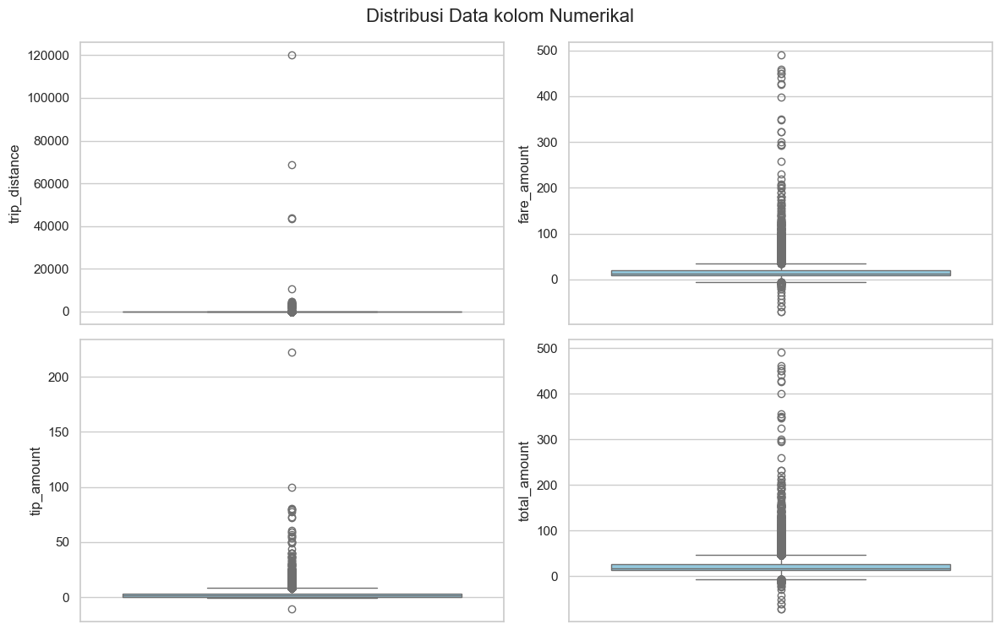

In [2619]:
sns.set(style="whitegrid")

# List of columns to plot
kolom_numerikal = ['trip_distance', 'fare_amount', 'tip_amount', 'total_amount']

plt.figure(figsize=(12, 8))

for i, col in enumerate(kolom_numerikal, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(data=df[col], color='skyblue')

plt.suptitle('Distribusi Data kolom Numerikal', fontsize=16)
plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()

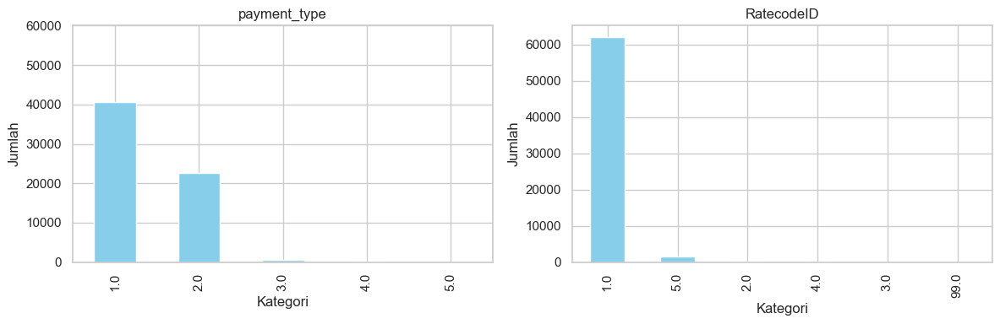

In [2620]:
kolom_kategorikal = ['payment_type', 'RatecodeID']

fig, axes = plt.subplots(nrows=1, ncols=len(kolom_kategorikal), figsize=(12,4))

for ax, col in zip(axes, kolom_kategorikal):
    value_counts = df[col].value_counts()
    value_counts.plot(kind='bar', ax=ax, color='skyblue')
    ax.set_title(col)
    ax.set_xlabel('Kategori')
    ax.set_ylabel('Jumlah')
    y_ticks = range(0, 60001, 10000)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([str(tick) for tick in y_ticks])

plt.tight_layout()
plt.show()

In [2621]:
for col in kolom_kategorikal:
    print(f"Distribusi frekuensi untuk {col}:")
    print(df[col].value_counts())
    print("\n")

Distribusi frekuensi untuk payment_type:
payment_type
1.0    40686
2.0    22632
3.0      472
4.0       95
5.0        2
Name: count, dtype: int64


Distribusi frekuensi untuk RatecodeID:
RatecodeID
1.0     62103
5.0      1529
2.0       158
4.0        57
3.0        30
99.0       10
Name: count, dtype: int64




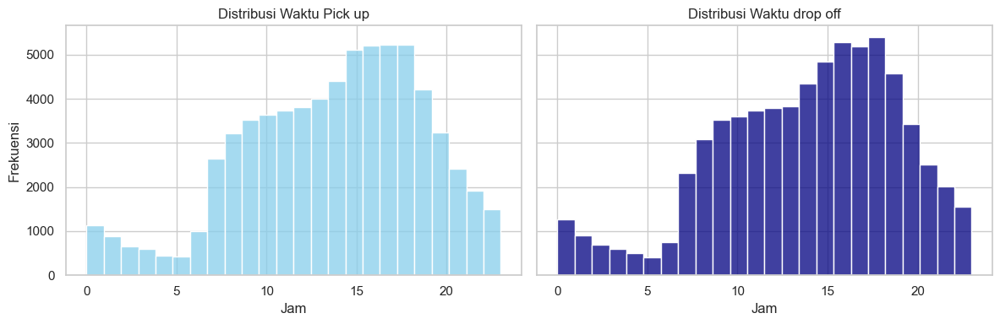

In [2622]:

df['pickup_hour'] = df['lpep_pickup_datetime'].dt.hour
df['dropoff_hour'] = df['lpep_dropoff_datetime'].dt.hour

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,4), sharey=True)

sns.histplot(df['pickup_hour'], bins=24, ax=axes[0], color='skyblue')
axes[0].set_title('Distribusi Waktu Pick up')
axes[0].set_xlabel('Jam')
axes[0].set_ylabel('Frekuensi')

sns.histplot(df['dropoff_hour'], bins=24, ax=axes[1], color='navy')
axes[1].set_title('Distribusi Waktu drop off')
axes[1].set_xlabel('Jam')

plt.tight_layout()
plt.show()

In [2623]:
df.isna().sum()

lpep_pickup_datetime        0
lpep_dropoff_datetime       0
RatecodeID               4324
PULocationID                0
DOLocationID                0
trip_distance               0
fare_amount                 0
tip_amount                  0
total_amount                0
payment_type             4324
trip_type                4334
PUBorough                   0
PUZone                      0
PUservice_zone              0
DOBorough                   0
DOZone                      0
DOservice_zone              0
pickup_hour                 0
dropoff_hour                0
dtype: int64

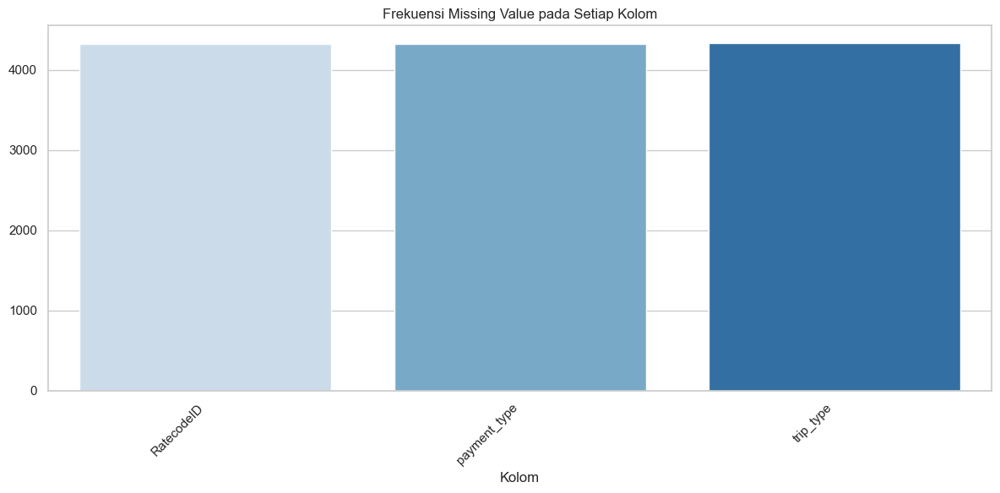

In [2624]:
missing_values = df.isna().sum()

missing_values = missing_values[missing_values > 0]

plt.figure(figsize=(12, 6))
sns.barplot(x=missing_values.index, y=missing_values.values, palette='Blues')
plt.xticks(rotation=45, ha='right')
plt.title('Frekuensi Missing Value pada Setiap Kolom')
plt.xlabel('Kolom')
plt.ylabel('')
plt.tight_layout()
plt.show()

---


# 3. Data Cleaning

#### 3.1 Missing Value

Langkah pertama dalam proses cleaning data adalah mengatasi missing Value, dari dataset yang telah didapat, cari nilai yang hilang yang disesabkan beberapa kemungkinan, salah satunya adalah data memang benar-benar tidak ada, bernilai kosong atau lupa saat melakukan input, berikut adalah jumlah serta presentase missing value pada setiap kolom.

In [2625]:
pd.DataFrame({
    'feature': df.columns.values,
    'data_type': df.dtypes.values,
    'null_value(n)': df.isna().sum(),
    'null_value(%)': df.isna().mean().values * 100
}).round(1)

,feature,data_type,null_value(n),null_value(%)
lpep_pickup_datetime,lpep_pickup_datetime,datetime64[ns],0,0.0
lpep_dropoff_datetime,lpep_dropoff_datetime,datetime64[ns],0,0.0
RatecodeID,RatecodeID,float64,4324,6.3
PULocationID,PULocationID,int64,0,0.0
DOLocationID,DOLocationID,int64,0,0.0
trip_distance,trip_distance,float64,0,0.0
fare_amount,fare_amount,float64,0,0.0
tip_amount,tip_amount,float64,0,0.0
total_amount,total_amount,float64,0,0.0
payment_type,payment_type,float64,4324,6.3


Missing value terdapat pada 3 kolom yaitu *RatecodeID*, *payment_type* dan *trip_type*, maka untuk mengisi missing value dari ketiga kolom tersebut adalah dengan cara menampilkan nilai modus dari setiap kolom.

In [2626]:
mode_RatecodeID = df['RatecodeID'].mode()[0]
mode_payment_type = df['payment_type'].mode()[0]
mode_trip_type = df['trip_type'].mode()[0]

print('Modus dari RatecodeID adalah:', mode_RatecodeID)
print('Modus dari payment_type adalah:', mode_payment_type)
print('Modus dari trip_type adalah:', mode_trip_type)

Modus dari RatecodeID adalah: 1.0
Modus dari payment_type adalah: 1.0
Modus dari trip_type adalah: 1.0


##### 3.1.1 menangani Missing Value pada kolom RatecodeID

Pada kolom Rate Code id memiliki angka yang terdiri dari angka 1, 2, 3, 4, 5, dan 99, serta missing value, untuk mengatasi missing value dilakukan pengisian data dengan nilai modus atau nilai yang paling sering muncul yaitu angka 1, selain itu, permasalahan yang lain adalah terdapat anga 99, angka tersebut akan diganti oleh angka 1 sebagai nilai rerata serta pertimbangan lainnya adalah dikarenakan data tidak terdistribusi dengan normal

In [2627]:
df['RatecodeID'].fillna(1, inplace=True)
df['RatecodeID'].replace(99, 1)
df['RatecodeID'].to_frame()

,RatecodeID
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
68206,1.0
68207,1.0
68208,1.0
68209,1.0


#### 3.1.2 menangani Missing Value pada kolom payment_type

Berdasarkan description features main data dijelaskan bahwa tips diberikan hanya untuk metode pembayaran menggunakan kartu kredit akan terisi secara otomatis. Oleh karena itu, dapat disimpulkan jika tips = 0 maka metode yang digunakan adalah kartu kredit karena pelanggan tidak memberikan tip.

In [2628]:
df[(df['tip_amount']>0)]['payment_type'].value_counts().to_frame()


,count
payment_type,
1.0,35541
3.0,8
4.0,1
2.0,1


In [2629]:
df['payment_type'].fillna(1, inplace=True)


Setelah dilakukan pengecekan, terdapat satu baris yang error dimana harusnya semua tip_amount > 0 menggunakan payment_type 1 yaitu kartu kredit.

#### 3.1.3 menangani Missing Value pada kolom trip_type

Untuk mengisi value yang kosong pada kolom trip_type akan diisi dengan nilai 1

In [2630]:
df['trip_type'].corr(df['RatecodeID'], method='pearson')


np.float64(0.9363117160484363)

In [2631]:
df['trip_type'].fillna(1, inplace=True)


### 3.2 Negative Value

terdapat 3 kolom yang bernilai negatif yaitu *fare_amount*, *tip_amount*, *total_amount*, ini menandakan, bahwa ada kemungkinan trip pelanggan *dicancel*, namun karena sudah masuk ke sistem tetapi perjalanan dibatalkan, maka dana yang sudah masuk ke perusahaan akan dikembalikan kepada penumpang yang melakukan *cancel trip* tersebut, maka

In [2632]:
negative_values_df = df[(df['fare_amount'] < 0) | (df['tip_amount'] < 0) | (df['total_amount'] < 0)]
negative_values_df.head()

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,tip_amount,total_amount,payment_type,trip_type,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone,pickup_hour,dropoff_hour
662,2023-01-01 14:58:13,2023-01-01 14:58:39,1.0,75,74,0.17,-3.0,0.0,-4.5,3.0,1.0,Manhattan,East Harlem South,Boro Zone,Manhattan,East Harlem North,Boro Zone,14,14
898,2023-01-01 17:24:52,2023-01-01 17:25:12,1.0,193,193,0.00,-3.0,0.0,-4.5,4.0,1.0,Queens,Queensbridge/Ravenswood,Boro Zone,Queens,Queensbridge/Ravenswood,Boro Zone,17,17
1317,2023-01-02 02:05:08,2023-01-02 02:12:57,1.0,129,82,0.64,-8.6,0.0,-11.1,3.0,1.0,Queens,Jackson Heights,Boro Zone,Queens,Elmhurst,Boro Zone,2,2
1686,2023-01-02 12:56:53,2023-01-02 13:00:10,1.0,75,75,0.77,-4.5,0.0,-5.3,4.0,1.0,Manhattan,East Harlem South,Boro Zone,Manhattan,East Harlem South,Boro Zone,12,13
1864,2023-01-02 13:51:33,2023-01-02 13:52:42,1.0,75,75,0.08,-3.7,0.0,-5.2,3.0,1.0,Manhattan,East Harlem South,Boro Zone,Manhattan,East Harlem South,Boro Zone,13,13


In [2633]:
negative_fare_amount = df[df['fare_amount'] < 0]
negative_tip_amount = df[df['tip_amount'] < 0]
negative_total_amount = df[df['total_amount'] < 0]

print("Jumlah nilai negatif di fare_amount:", len(negative_fare_amount))
print("Jumlah nilai negatif di total_amount:", len(negative_total_amount))
print("Jumlah nilai negatif di tip_amount:", len(negative_tip_amount))



Jumlah nilai negatif di fare_amount: 176
Jumlah nilai negatif di total_amount: 179
Jumlah nilai negatif di tip_amount: 9


mengubah nilai negatif pada kolom fare_amount dan total_amount

In [2634]:
negatif_val_fare  = df[df['fare_amount']<0]
df.loc[negatif_val_fare.index, 'fare_amount'] = df['fare_amount'].abs()

negatif_val_total  = df[df['total_amount']<0]
df.loc[negatif_val_total.index, 'total_amount'] = df['total_amount'].abs()

semua nilai negative akan dijadikan duplicate kemudian dihapus untuk menjaga nilai mutlak dari nilai positif yang ada.

### 3.3 Zero Values

Pengisian nilai 0 yang dirasa tidak logis akan dilakukan dengan mengisi data dengan nilai median, untuk kolom tip_amount nilai 0 akan dipertahankan sebagai tanda bahwa pelanggan tidak memberikan tip kepada driver.

In [2635]:
pd.DataFrame({
    'feature': df.columns.values,
    'data_type': df.dtypes.values,
    '0_value(%)': [len(df[col][df[col] == 0]) / len(df) * 100 if np.issubdtype(df[col].dtype, np.number) else 0 for col in df.columns]
}).round(3)

,feature,data_type,0_value(%)
0,lpep_pickup_datetime,datetime64[ns],0.000
1,lpep_dropoff_datetime,datetime64[ns],0.000
2,RatecodeID,float64,0.000
3,PULocationID,int64,0.000
4,DOLocationID,int64,0.000
5,trip_distance,float64,4.911
6,fare_amount,float64,0.122
7,tip_amount,float64,42.251
8,total_amount,float64,0.101
9,payment_type,float64,0.000


In [2636]:
df = df[df['trip_distance']>0]
df = df[df['fare_amount']>0]
df = df[df['total_amount']>0]

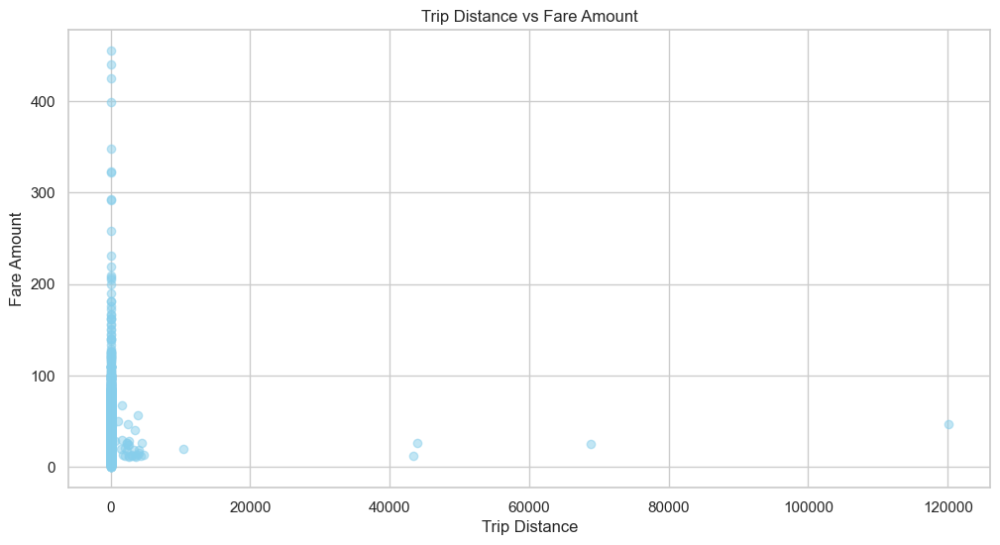

In [2637]:
plt.figure(figsize=(12, 6))
plt.scatter(df['trip_distance'], df['fare_amount'], alpha=0.5, color='skyblue')
plt.title('Trip Distance vs Fare Amount')
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.grid(True)
plt.show()

In [2638]:
df['pickup_hour'] = df['lpep_pickup_datetime'].dt.hour
df['dropoff_hour'] = df['lpep_dropoff_datetime'].dt.hour

zero_pickup_hour = df[df['pickup_hour'] == 0]
zero_dropoff_hour = df[df['dropoff_hour'] == 0]

print("Jumlah baris dengan pickup_hour = 0:", len(zero_pickup_hour))
print("Jumlah baris dengan dropoff_hour = 0:", len(zero_dropoff_hour))

Jumlah baris dengan pickup_hour = 0: 1059
Jumlah baris dengan dropoff_hour = 0: 1191


In [2639]:
df.drop(['pickup_hour', 'dropoff_hour'], axis=1, inplace=True)

pd.DataFrame({
    'feature': df.columns.values,
    'data_type': df.dtypes.values,
    '0_value(%)': [len(df[col][df[col] == 0]) / len(df) * 100 if np.issubdtype(df[col].dtype, np.number) else 0 for col in df.columns]
}).round(3)

,feature,data_type,0_value(%)
0,lpep_pickup_datetime,datetime64[ns],0.000
1,lpep_dropoff_datetime,datetime64[ns],0.000
2,RatecodeID,float64,0.000
3,PULocationID,int64,0.000
4,DOLocationID,int64,0.000
5,trip_distance,float64,0.000
6,fare_amount,float64,0.000
7,tip_amount,float64,40.525
8,total_amount,float64,0.000
9,payment_type,float64,0.000


pengecekan kembali nilai 0 terhadap semua kolom kecuali pada kolom tip_amount yang akan tetap dipertahankan.

### 3.4 Outliers

#### 3.4.1 Outliers pada kolom *fare_amount*

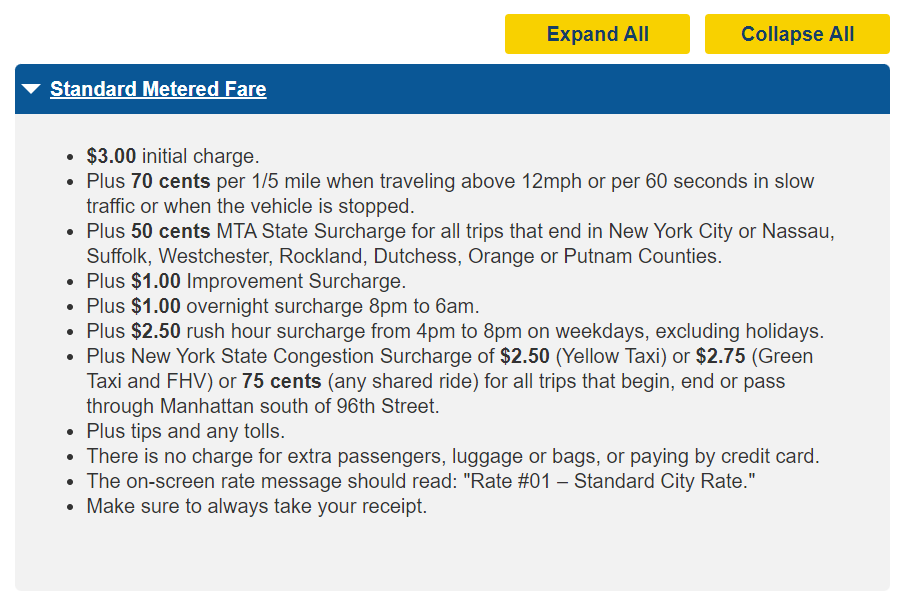

*sumber : https://www.nyc.gov/site/tlc/passengers/taxi-fare.page*

Berdasarkan regulasi dari pemerintah kota New York, *initial charge* atau harga tarif dasar perjalanan adalah sebesar $3.00, dan pada dataset tersebut terdapat data yang kurang sesuai, yaitu tarif kurang dari $3.00 seperti yang bisa ditampilkan berikut, nilai outliers akan dilakukan pengecekan, jika outliers dari kolom *fare_amount* kurang dari 5% maka data tersebut akan di drop, selain itu biaya trip akan dikenakan kenaikan sebanyak $0.70 setiap 0.2 milenya, artinya jika suatu perjalanan memilikit trip_distance kurang dari 0.2 mile namun memiliki fare_amount diatas $3.00, maka akan dianggap sebagai outliers

In [2640]:
df[['trip_distance', 'fare_amount']].sort_values(by='fare_amount', ascending=True)[df['fare_amount'] < 3]

,trip_distance,fare_amount
28492,5.80,0.01
48770,53.72,0.01
51719,3.30,0.01
24583,8.31,0.05
47824,0.01,0.15
43717,1.34,0.15
21775,0.03,0.30
33860,0.04,0.45
36365,1.40,1.50
20464,1.70,2.50


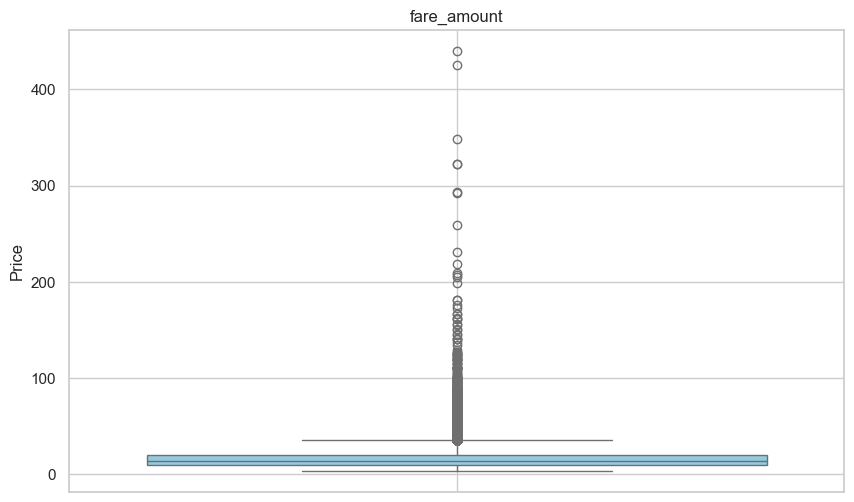

Summary Statistics for Fare Amount After Cleaning:
count    64363.000000
mean        16.441863
std         12.157782
min          3.000000
25%          9.300000
50%         13.070000
75%         19.640000
max        440.000000
Name: fare_amount, dtype: float64
Rows dropped: 479


In [2641]:
data_cleaned = df[df['fare_amount'] <= 100].copy()

rows_dropped = df.shape[0] - cleaned_data.shape[0]

trip_distance_stats_after_cleaning = cleaned_data['fare_amount'].describe()

plt.figure(figsize=(10, 6))
sns.boxplot(y=cleaned_data['fare_amount'], color='skyblue')
plt.title('fare_amount')
plt.ylabel('Price')
plt.grid(True)

plt.show()

print("Summary Statistics for Fare Amount After Cleaning:")
print(trip_distance_stats_after_cleaning)
print(f"Rows dropped: {rows_dropped}")

df = data_cleaned

In [2642]:
fare_amount_outliers = df[df['fare_amount'] < 3]
fare_outliers_percentage = fare_amount_outliers.shape[0]/len(df)*100
print(f"Nilai Outliers pada kolom fare_amount: {fare_outliers_percentage:.4f}%") 

# Outliers bernilai < 5%

Nilai Outliers pada kolom fare_amount: 0.0371%


In [2643]:
df.drop(fare_amount_outliers.index, inplace=True)

In [2644]:
outliers_fare_02 = df[(df['trip_distance'] < 0.2) & (df['fare_amount'] > 3.00)]
outliers_fare_02[['trip_distance', 'fare_amount']]

,trip_distance,fare_amount
163,0.09,100.00
208,0.03,50.00
214,0.04,30.00
215,0.12,30.00
221,0.02,35.00
...,...,...
66040,0.06,80.04
66264,0.01,48.19
67371,0.09,20.35
67478,0.02,25.81


In [2645]:
outliers_fare_02 = df[(df['trip_distance'] < 0.2) & (df['fare_amount'] > 3.00)]
outliers_02 = outliers_fare_02.shape[0]/len(df)*100
print(f"Nilai Outliers pada kolom fare_amount: {outliers_02:.4f}%")

# Outliers bernilai < 5%

Nilai Outliers pada kolom fare_amount: 0.6348%


In [2646]:
df.drop(outliers_fare_02.index, inplace=True)

#### 3.4.2 Outliers pada kolom *lpep_pickup_datetime* dan *lpep_dropoff_datetime*

Pada bagian ini terdapat 3 rentang waktu, yaitu tahun 2009, 2022 dan 2023, namun yang memiliki data paling lengkap adalah rentang waktu tahun 2023, sedangkan tahun 2022 dan 2009 hanya memiliki satu bulan data dan tidak lengkap secara keseluruhan dan tidak bisa dianalisa secara menyeluruh, berikut atalah frekuensi kemunculan bulan pada setiap tahun serta frekuensi tahun yang muncul pada dataset.

In [2647]:
df['lpep_pickup_datetime'].dt.month.value_counts().to_frame()

,count
lpep_pickup_datetime,
1,64327
12,2
2,1


In [2648]:
df['lpep_pickup_datetime'].dt.year.value_counts().to_frame()


,count
lpep_pickup_datetime,
2023,64327
2022,2
2009,1


In [2649]:
datetime_outliers = df[(df['lpep_pickup_datetime'].dt.month!=1) | (df['lpep_pickup_datetime'].dt.year!=2023)]
datetime_outliers[['lpep_pickup_datetime','lpep_pickup_datetime']]

,lpep_pickup_datetime,lpep_pickup_datetime
298,2022-12-09 14:10:49,2022-12-09 14:10:49
318,2022-12-09 14:55:42,2022-12-09 14:55:42
17874,2009-01-01 20:21:27,2009-01-01 20:21:27
25100,2023-02-01 03:10:05,2023-02-01 03:10:05


In [2650]:
datetime_outliers = df[(df['lpep_pickup_datetime'].dt.month!=1) | (df['lpep_pickup_datetime'].dt.year!=2023)]
datetime_outliers_percent = datetime_outliers.shape[0]/len(df)*100
print(f"Nilai Outliers Datetime :, {datetime_outliers_percent:.4f}%")

Nilai Outliers Datetime :, 0.0062%


In [2651]:
df.drop(datetime_outliers.index, inplace=True)

data diatas terdapat 4 baris yang memiliki tahun diluar 2023, dikarenakan ketidak lengkapan data pada tahun 2009 dan 2022, maka diputuskan untuk menghapus data tersebut dan terdeskripsi sebagai outlier, sehingga analisis akan difokuskan pada tahun 2023.

#### 3.4.3 Outliers pada kolom trip_distance

pada kolom trip_distance, ditemukan jarak yang melebihi 1000 miles, maka dari itu, jarak yang dianggap kurang logis untuk order sewa kendaraan seperti taxi dan limousine, akan kita drop dan membatasi data menjadi <= 100 mile untuk memudahkan analisis.

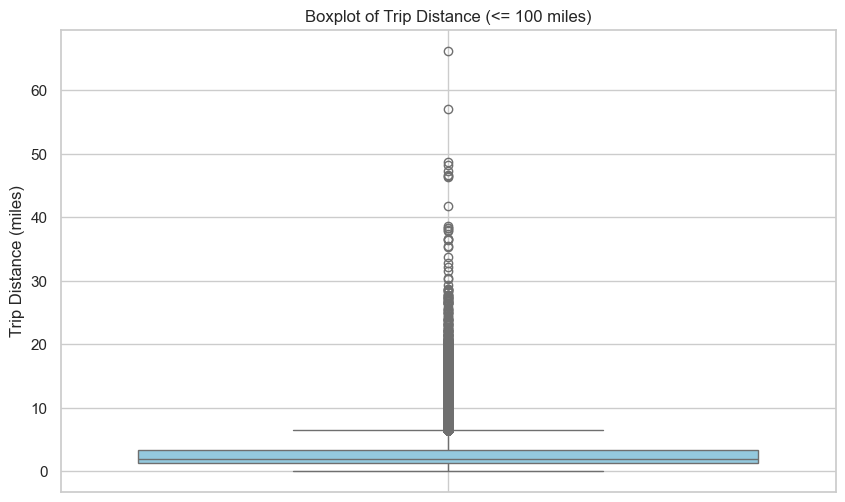

Summary Statistics for Trip Distance After Cleaning:
count    64363.000000
mean         2.823509
std          2.789665
min          0.010000
25%          1.240000
50%          1.950000
75%          3.340000
max         66.180000
Name: trip_distance, dtype: float64
Rows dropped: -37


In [2652]:
data_cleaned = df[df['trip_distance'] <= 100].copy()

rows_dropped = df.shape[0] - cleaned_data.shape[0]

trip_distance_stats_after_cleaning = cleaned_data['trip_distance'].describe()

plt.figure(figsize=(10, 6))
sns.boxplot(y=cleaned_data['trip_distance'], color='skyblue')
plt.title('Boxplot of Trip Distance (<= 100 miles)')
plt.ylabel('Trip Distance (miles)')
plt.grid(True)

plt.show()

print("Summary Statistics for Trip Distance After Cleaning:")
print(trip_distance_stats_after_cleaning)
print(f"Rows dropped: {rows_dropped}")

df = data_cleaned

In [2653]:
df.describe()

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,tip_amount,total_amount,payment_type,trip_type
count,64289,64289,64289.000000,64289.000000,64289.000000,64289.000000,64289.000000,64289.000000,64289.000000,64289.000000,64289.000000
mean,2023-01-16 22:32:54.809749760,2023-01-16 22:50:56.252702720,1.066186,97.335361,138.315917,2.797011,16.279428,2.195296,21.580114,1.347727,1.010328
min,2023-01-01 00:01:31,2023-01-01 00:13:26,1.000000,3.000000,1.000000,0.010000,3.000000,0.000000,3.500000,1.000000,1.000000
25%,2023-01-09 12:21:31,2023-01-09 12:37:37,1.000000,74.000000,74.000000,1.230000,9.300000,0.000000,12.960000,1.000000,1.000000
50%,2023-01-17 09:18:33,2023-01-17 09:35:43,1.000000,75.000000,138.000000,1.940000,13.000000,1.820000,17.900000,1.000000,1.000000
75%,2023-01-24 16:04:34,2023-01-24 16:19:35,1.000000,116.000000,220.000000,3.330000,19.480000,3.410000,26.040000,2.000000,1.000000
max,2023-01-31 23:58:23,2023-02-01 17:27:05,99.000000,265.000000,265.000000,66.180000,100.000000,222.220000,232.720000,4.000000,2.000000
std,NaN,NaN,1.298388,59.948513,76.433787,2.650041,10.908130,2.969724,13.185964,0.490952,0.101103


### 3.4.4 Feature Creation

##### a. trip distance dan durations

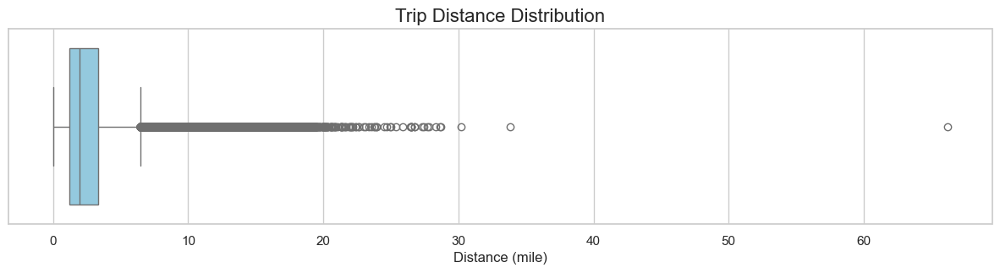

In [2654]:
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x='trip_distance', color='skyblue')
plt.xlabel('Distance (mile)')
plt.title('Trip Distance Distribution', fontsize=16)

plt.show()

dalam diagram diatas terdapat jarak yang tidak wajar, yaitu dibawah 1 Km, atau dalam satuan di US 1 Km = 0,62 mile, hal ini kemungkinan pemesanan taxi dibatalkan, maka semua nilai tidak wajar tersebut akan di hapus.

In [2655]:
print('Banyaknya data yang memiliki jarak kurang dari 1 km (0,62 miles):', len(df[df['trip_distance']<0.62]))
df = df[df['trip_distance']>0.62]

Banyaknya data yang memiliki jarak kurang dari 1 km (0,62 miles): 3188


In [2656]:
outliers = df[df['trip_distance']>50][['PULocationID', 'DOLocationID', 'trip_distance']]
print('Total outliers:',len(outliers))
outliers.head()

Total outliers: 1


,PULocationID,DOLocationID,trip_distance
7322,134,134,66.18


In [2657]:
ct_distance_byid = df[df['trip_distance']<50].groupby(['PULocationID', 'DOLocationID']).agg(count=('trip_distance', 'count'),
                                                                                            avg_distance=('trip_distance', 'mean'),
                                                                                            median_distance=('trip_distance', 'median')).reset_index()
ct_distance_byid.sample(7, random_state=3)

,PULocationID,DOLocationID,count,avg_distance,median_distance
4063,196,260,20,3.055000,2.98
2338,95,25,1,11.180000,11.18
57,7,140,12,3.696667,3.61
1617,74,18,5,6.892000,6.40
2908,129,163,2,5.580000,5.58
4204,216,260,1,10.760000,10.76
2332,95,10,15,4.482667,4.46


In [2658]:
distance_byid = pd.merge(outliers, ct_distance_byid, on=['PULocationID', 'DOLocationID'], how='left')
distance_byid.drop(columns='count', axis=1, inplace=True)
distance_byid.index = outliers.index
display(distance_byid.head(5))

print('Hasil Inputasi:')
df.loc[outliers.index, 'trip_distance'] = distance_byid['median_distance']
df.loc[outliers.index][['PULocationID', 'DOLocationID', 'trip_distance']].head()

,PULocationID,DOLocationID,trip_distance,avg_distance,median_distance
7322,134,134,66.18,1.129205,0.91


Hasil Inputasi:


,PULocationID,DOLocationID,trip_distance
7322,134,134,0.91


pembuatan kategorisasi untuk jarak, pada feature ini akan dibuat bins yang mengkategorikan berdasarkan jarak tertentu.

In [2659]:
bins_of_distance = [0, 2, 6, 10, np.inf] 
labels_of_distance = ['<2 miles', '3-6 miles', '7-10 miles', '>10 miles']

df['distance_bins'] = pd.cut(df['trip_distance'], bins=bins_of_distance, labels=labels_of_distance)

df['distance_bins'].value_counts()

distance_bins
<2 miles      30013
3-6 miles     24735
7-10 miles     4640
>10 miles      1617
Name: count, dtype: int64

pada feature ini akan dibuat untuk mengetahui durasi trip berdasarkan jam pick up dan drop offnya yang akan digunakan sebagai bahan analisis kedepannya.

In [2660]:
diff = (df['lpep_dropoff_datetime'] - df['lpep_pickup_datetime']).dt.total_seconds()/60
df['trip_duration'] = diff.round(2)

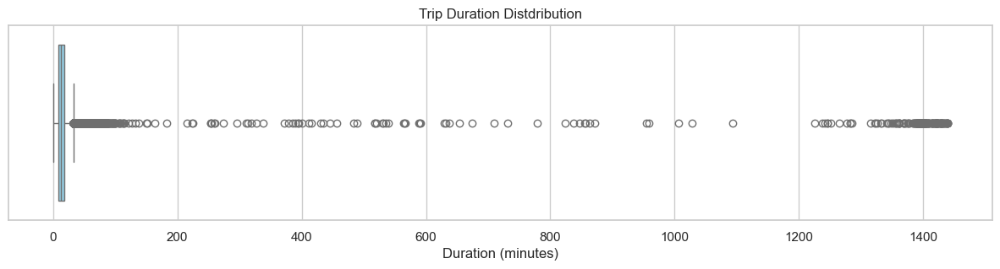

In [2661]:
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x='trip_duration', color='skyblue')
plt.xlabel('Duration (minutes)')
plt.title('Trip Duration Distdribution')


plt.show()

umumnya perjalanan menggunakan Taxi bisa melebihi 3 menit, pada bagian ini, jika jarak tempuh pesanan taxi kurang dari rentang waktu tersebut akan di hapus, dikarenakan tidak wajar, selain itu, kemungkinan lainnya adalah bahwa pesanan tersebut dibatalkan (cancel order).

In [2662]:
print('Banyaknya data yang memiliki durasi order kurang dari 2 menit:', len(df[df['trip_duration']<=2]))
df = df[df['trip_duration']>2]

Banyaknya data yang memiliki durasi order kurang dari 2 menit: 131


In [2663]:
df[df['trip_distance']==df['trip_distance'].max()]

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,tip_amount,total_amount,payment_type,trip_type,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone,distance_bins,trip_duration
27947,2023-01-14 18:05:45,2023-01-14 19:41:27,5.0,166,132,33.8,100.0,21.3,127.85,1.0,2.0,Manhattan,Morningside Heights,Boro Zone,Queens,JFK Airport,Airports,>10 miles,95.7


---

In [2664]:
outliers = df[df['trip_duration']>250][['PULocationID', 'DOLocationID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime', 'trip_duration']]
print('Total extreme outliers : ', len(outliers))
outliers.head()

Total extreme outliers :  225


,PULocationID,DOLocationID,lpep_pickup_datetime,lpep_dropoff_datetime,trip_duration
49,255,48,2023-01-01 00:23:04,2023-01-01 23:18:32,1375.47
108,260,223,2023-01-01 01:53:59,2023-01-02 00:00:00,1326.02
118,129,37,2023-01-01 01:25:46,2023-01-02 00:29:15,1383.48
207,129,129,2023-01-01 03:12:42,2023-01-02 02:03:43,1371.02
262,65,37,2023-01-01 04:03:36,2023-01-02 03:31:50,1408.23


In [2665]:
ct_duration_byid = df[df['trip_duration']<250].groupby(['PULocationID', 'DOLocationID']).agg(count=('distance_bins', 'count'), 
                                                                                                 mean_duration=('trip_duration', 'mean'), 
                                                                                                 median_duration=('trip_duration', 'median')).reset_index()
ct_duration_byid.sample(5, random_state=3)

,PULocationID,DOLocationID,count,mean_duration,median_duration
1890,75,242,1,22.00,22.00
626,37,107,1,19.23,19.23
3238,150,29,1,45.00,45.00
2105,82,232,2,22.49,22.49
111,7,248,1,19.97,19.97


##### b. day_category

day category akan menandakan hari seperti pada saat weekdays dan weekend, kedepannya akan digunakan sebagai analisis puncak permintaan.

In [2666]:
time_bins = [0, 5, 11, 15, 20, 24] 
time_labels = ['Midnight', 'Morning', 'Noon', 'Evening', 'Night']
df['pickup_time'] = pd.cut(df['lpep_pickup_datetime'].dt.hour, bins=time_bins, labels=time_labels, right=False)

df['day_category'] = df['lpep_pickup_datetime'].dt.day_name().apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekdays')


##### c. RatecodeID

Pada bagian bagian RatecodeID, bagian yang merupakan angka seperti 1, 2, 3, 5, 6 dan 99 akan diganti menjadi kategori tipe perjalanan, angka 99 akan dianggap sebagai outlier, maka dari itu, angka 99 akan diganti menjadi 1, dimana 1 merupakan nilai modus dari kolom RatecodeID, berikut deksripsi dari tipe perjalannya:

| No. |TYPE | DESKRIPSI|
| --- | ---------- | --------------|
|1|Standard Rate|perjalanan dengan harga standar yang telah ditentukan (harga tetap) oleh pihak NYC Taxi untuk perjalanan antar blok dalam kota|
|2|JFK Airport|perjalanan dengan harga standar yang telah ditentukan (harga tetap) oleh pihak NYC Taxi untuk perjalanan tujuan bandara John F. Kennedy (JFK)|
|3|Newark Airport|perjalanan dengan harga standar yang telah ditentukan (harga tetap) oleh pihak NYC Taxi untuk perjalanan tujuan bandara Newark di New Jersey|
|4|Nassau or Westchester|perjalanan dengan harga standar yang telah ditentukan (harga tetap) oleh pihak NYC Taxi untuk perjalanan tujuan atau dari county Nassau / Westchester|
|5|Negotiated fare|perjalanan dengan harga yang telah dinegosiasi oleh pelanggan kepada driver dengan kesepakatan harga yang telah ditawar dan disepakati|
|6|Shared ride|perjalanan dengan yang berbagi dengan pelanggan / penumpang lain dengan harga yang telah disepakati oleh driver|
|99|*Unknown*|*Unknown*|


In [2667]:
df['RatecodeID'].replace(99, 1, inplace=True)
df['RatecodeID'] = df['RatecodeID'].replace({1:'Standard rate', 2:'JFK Airport', 3:'Newark Airport', 4:'Nassau or Westchester', 5:'Negotiated fare', 6:'Shared ride'})
df['RatecodeID'].value_counts().to_frame()

,count
RatecodeID,
Standard rate,60083
Negotiated fare,641
JFK Airport,113
Nassau or Westchester,31
Newark Airport,6


---


# 4. Analisis

In [2668]:
# Cleaned Data

df.to_csv("NYC_clean_data.csv")
df

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,tip_amount,total_amount,payment_type,...,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone,distance_bins,trip_duration,pickup_time,day_category
0,2023-01-01 00:26:10,2023-01-01 00:37:11,Standard rate,166,143,2.58,14.90,4.03,24.18,1.0,...,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone,3-6 miles,11.02,Midnight,Weekend
1,2023-01-01 00:51:03,2023-01-01 00:57:49,Standard rate,24,43,1.81,10.70,2.64,15.84,1.0,...,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone,<2 miles,6.77,Midnight,Weekend
3,2023-01-01 00:13:14,2023-01-01 00:19:03,Standard rate,41,238,1.30,6.50,1.70,10.20,1.0,...,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone,<2 miles,5.82,Midnight,Weekend
4,2023-01-01 00:33:04,2023-01-01 00:39:02,Standard rate,41,74,1.10,6.00,0.00,8.00,1.0,...,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone,<2 miles,5.97,Midnight,Weekend
5,2023-01-01 00:53:31,2023-01-01 01:11:04,Standard rate,41,262,2.78,17.70,0.00,22.95,2.0,...,Manhattan,Central Harlem,Boro Zone,Manhattan,Yorkville East,Yellow Zone,3-6 miles,17.55,Midnight,Weekend
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68205,2023-01-31 21:56:00,2023-01-31 22:14:00,Standard rate,75,186,3.92,20.72,1.25,25.02,1.0,...,Manhattan,East Harlem South,Boro Zone,Manhattan,Penn Station/Madison Sq West,Yellow Zone,3-6 miles,18.00,Night,Weekdays
68207,2023-01-31 22:40:00,2023-01-31 22:48:00,Standard rate,10,205,2.14,4.41,0.00,5.41,1.0,...,Queens,Baisley Park,Boro Zone,Queens,Saint Albans,Boro Zone,3-6 miles,8.00,Night,Weekdays
68208,2023-01-31 23:46:00,2023-02-01 00:02:00,Standard rate,66,37,3.44,16.53,3.51,21.04,1.0,...,Brooklyn,DUMBO/Vinegar Hill,Boro Zone,Brooklyn,Bushwick South,Boro Zone,3-6 miles,16.00,Night,Weekdays
68209,2023-01-31 23:01:00,2023-01-31 23:19:00,Standard rate,225,189,3.03,14.98,3.20,19.18,1.0,...,Brooklyn,Stuyvesant Heights,Boro Zone,Brooklyn,Prospect Heights,Boro Zone,3-6 miles,18.00,Night,Weekdays


Pada bagian 4, sudah dilakukan visualisasi distribusi setiap kolom untuk variabel numerik. Sebelum melakukan uji statistik lebih lanjut, perlu dipastikan bahwa distribusi tersebut dapat dibuktikan dengan akurat melalui uji normalitas. Data yang dimiliki kini sebanyak `60874` baris oleh karena itu kami menguju menggunakan `*Uji D'Agostino-Pearson*` yang dapat memberikan hasil akurat untuk data yang berjumlah lebih dari 5000.

In [2669]:
# Uji D'Agostino-Pearson

kolom=df.describe(include=['int64', 'float64']).columns
hasil=pd.DataFrame(columns=['P-Value','Keputusan','Keterangan'])
for k in kolom:
    stat, pvalue = normaltest(
        df[k]
    )
    if pvalue<=0.05:
        ket='Tidak terdistribusi normal'
        kep='Tolak H0'
    else:
        ket='Terdistribusi Normal'
        kep='Gagal tolak H0'
    hasil.loc[k]=[pvalue,kep,ket]
display(hasil)

,P-Value,Keputusan,Keterangan
PULocationID,0.0,Tolak H0,Tidak terdistribusi normal
DOLocationID,0.0,Tolak H0,Tidak terdistribusi normal
trip_distance,0.0,Tolak H0,Tidak terdistribusi normal
fare_amount,0.0,Tolak H0,Tidak terdistribusi normal
tip_amount,0.0,Tolak H0,Tidak terdistribusi normal
total_amount,0.0,Tolak H0,Tidak terdistribusi normal
payment_type,0.0,Tolak H0,Tidak terdistribusi normal
trip_type,0.0,Tolak H0,Tidak terdistribusi normal
trip_duration,0.0,Tolak H0,Tidak terdistribusi normal


a. Kolom Numerikal

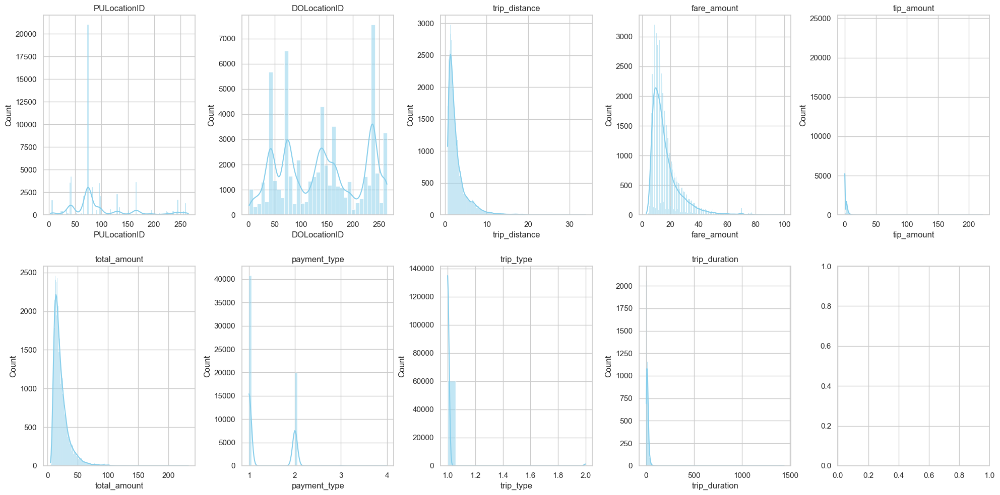

In [2670]:
fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()

for k, v in df.select_dtypes(include=[np.number]).items():
    axs[index].set_title(k)
    sns.histplot(v, ax=axs[index], kde=True, color='skyblue')
    index += 1

plt.tight_layout(w_pad=0.5, h_pad=2)
plt.show()

b. Kolom Kategorikal

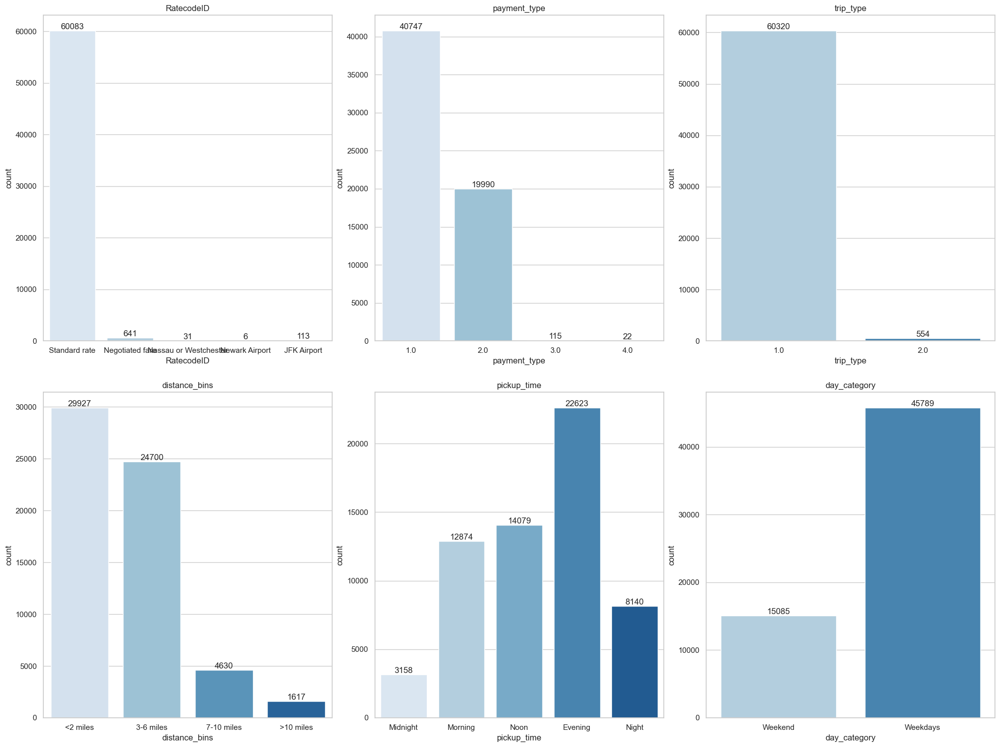

In [2671]:
cols = ['RatecodeID', 'payment_type', 'trip_type', 'distance_bins', 'pickup_time', 'day_category']

fig, axs = plt.subplots(ncols=3, nrows=2, figsize=(20, 15))
axs = axs.flatten()

for i, col in enumerate(cols):
    bars = sns.countplot(data=df, x=col, palette='Blues', ax=axs[i])
    axs[i].set_title(col)
    for idx, bar in enumerate(bars.patches):
        x_value = bar.get_x() + bar.get_width() / 2
        y_value = bar.get_height()
        label = "{:.0f}".format(bar.get_height())
        axs[i].text(x_value, y_value, label, ha='center', va='bottom') 

plt.tight_layout(w_pad=0.5, h_pad=2)
plt.show()

c. Uji Korelasi 

Uji korelasi dilakukan untuk melihat hubungan variabel satu dengan yang lainnya. Hal ini dapat membantu menyimpulkan faktor-fator yang saling berkaitan yang berhubungan dengan karakteristik antar data. Penggunaan heatmap agar mendapatkan visualisasi yang berisi nilai korelasi pada seluruh variabel.

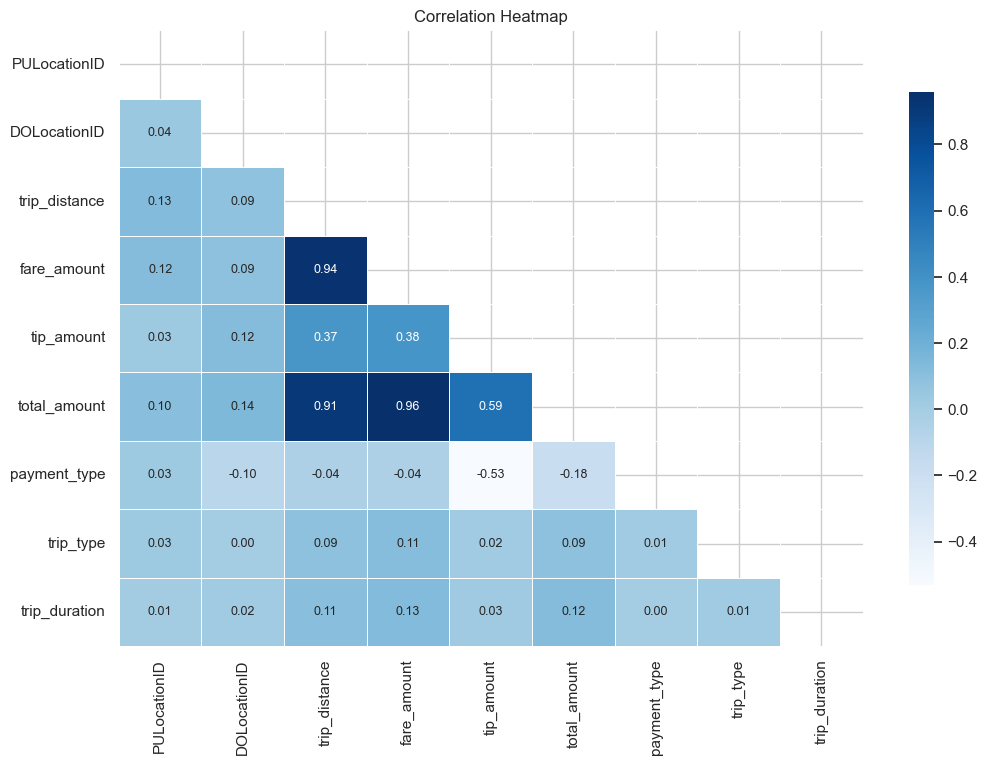

In [2672]:
numerical_df = df.select_dtypes(include=[np.number])

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
sns.heatmap(
    numerical_df.corr(),
    mask=np.triu(np.ones_like(numerical_df.corr(), dtype=bool)),
    cmap='Blues',
    annot=True,
    fmt=".2f",
    linewidths=.5,
    cbar_kws={"shrink": 0.8},
    annot_kws={"fontsize": 9}
)
plt.title('Correlation Heatmap')
plt.show()

### 4.1 Analisa - Tip

Pada analisa tip, langkah pertama yang akan dilakukan adalah membuat label atau mengkategorikan tip sesuai dengan rentang besarannya, seperti contoh berikut:

1. 0$ -> Tidak memberi tip
2. 1-10$ -> Memberi tip pada rentang 21-30 USD
3. 11-20$ -> Memberi tip pada rentang 21-30 USD
4. 21-30$ -> Memberi tip pada rentang 21-30 USD
5. '> 30$' -> Memberi tip diatas 30 USD


In [2673]:
bins_tip = [-np.inf, 0, 10, 20, 30, np.inf]
labels_tip = ['0$', '1-10$', '11-20$', '21-30$', '>30$']
df['tip_amount_bins'] = pd.cut(df['tip_amount'], bins=bins_tip, labels=labels_tip)
df

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,tip_amount,total_amount,payment_type,...,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone,distance_bins,trip_duration,pickup_time,day_category,tip_amount_bins
0,2023-01-01 00:26:10,2023-01-01 00:37:11,Standard rate,166,143,2.58,14.90,4.03,24.18,1.0,...,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone,3-6 miles,11.02,Midnight,Weekend,1-10$
1,2023-01-01 00:51:03,2023-01-01 00:57:49,Standard rate,24,43,1.81,10.70,2.64,15.84,1.0,...,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone,<2 miles,6.77,Midnight,Weekend,1-10$
3,2023-01-01 00:13:14,2023-01-01 00:19:03,Standard rate,41,238,1.30,6.50,1.70,10.20,1.0,...,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone,<2 miles,5.82,Midnight,Weekend,1-10$
4,2023-01-01 00:33:04,2023-01-01 00:39:02,Standard rate,41,74,1.10,6.00,0.00,8.00,1.0,...,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone,<2 miles,5.97,Midnight,Weekend,0$
5,2023-01-01 00:53:31,2023-01-01 01:11:04,Standard rate,41,262,2.78,17.70,0.00,22.95,2.0,...,Central Harlem,Boro Zone,Manhattan,Yorkville East,Yellow Zone,3-6 miles,17.55,Midnight,Weekend,0$
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68205,2023-01-31 21:56:00,2023-01-31 22:14:00,Standard rate,75,186,3.92,20.72,1.25,25.02,1.0,...,East Harlem South,Boro Zone,Manhattan,Penn Station/Madison Sq West,Yellow Zone,3-6 miles,18.00,Night,Weekdays,1-10$
68207,2023-01-31 22:40:00,2023-01-31 22:48:00,Standard rate,10,205,2.14,4.41,0.00,5.41,1.0,...,Baisley Park,Boro Zone,Queens,Saint Albans,Boro Zone,3-6 miles,8.00,Night,Weekdays,0$
68208,2023-01-31 23:46:00,2023-02-01 00:02:00,Standard rate,66,37,3.44,16.53,3.51,21.04,1.0,...,DUMBO/Vinegar Hill,Boro Zone,Brooklyn,Bushwick South,Boro Zone,3-6 miles,16.00,Night,Weekdays,1-10$
68209,2023-01-31 23:01:00,2023-01-31 23:19:00,Standard rate,225,189,3.03,14.98,3.20,19.18,1.0,...,Stuyvesant Heights,Boro Zone,Brooklyn,Prospect Heights,Boro Zone,3-6 miles,18.00,Night,Weekdays,1-10$


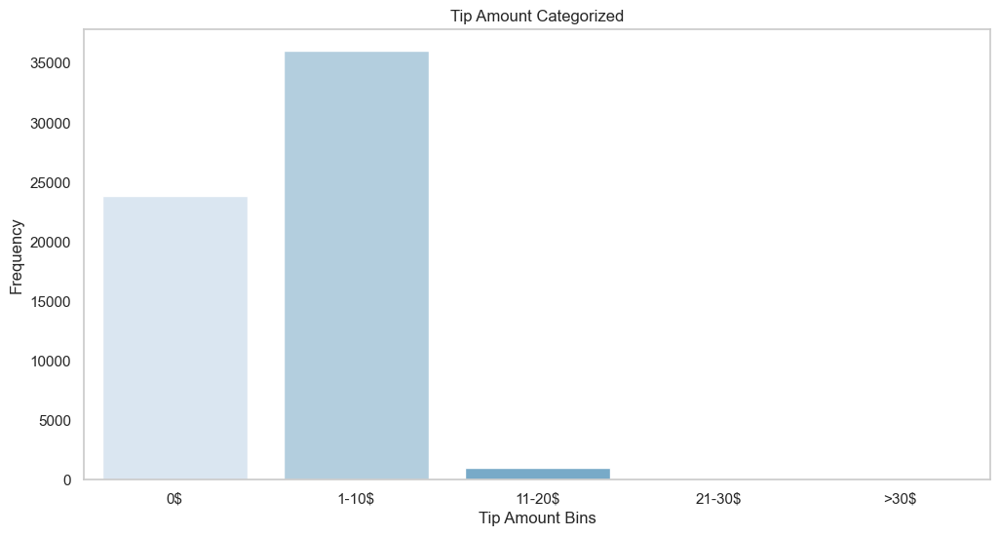

In [2674]:
plt.figure(figsize=(12, 6))
sns.countplot(x='tip_amount_bins', data=df, palette='Blues')
plt.title('Tip Amount Categorized')
plt.xlabel('Tip Amount Bins')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

In [2675]:
tip_amount_bin_counts = df['tip_amount_bins'].value_counts()
print("Tip Amount Frequency:")
print(tip_amount_bin_counts)

Tip Amount Frequency:
tip_amount_bins
1-10$     36027
0$        23815
11-20$      970
21-30$       42
>30$         20
Name: count, dtype: int64


In [2676]:
bins_fare = [0, 20, 40, 60, 80, np.inf]
labels_fare = ['<20$', '21-40$', '41-60$', '61-80$', '>80$']
df['fare_amount_bins'] = pd.cut(df['fare_amount'], bins=bins_fare, labels=labels_fare)

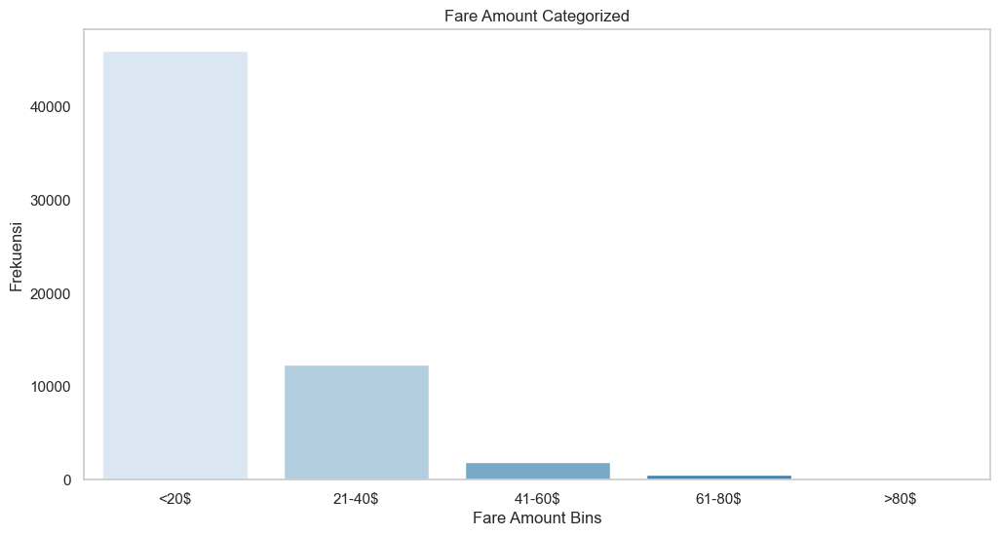

In [2677]:
plt.figure(figsize=(12, 6))
sns.countplot(x='fare_amount_bins', data=df, palette='Blues')
plt.title('Fare Amount Categorized')
plt.xlabel('Fare Amount Bins')
plt.ylabel('Frekuensi')
plt.grid(axis='y')
plt.show()

In [2678]:
fare_amount_bin_counts = df['fare_amount_bins'].value_counts()
print("Fare Amount Frequency:")
print(fare_amount_bin_counts)

Fare Amount Frequency:
fare_amount_bins
<20$      46013
21-40$    12323
41-60$     1888
61-80$      562
>80$         88
Name: count, dtype: int64


##### a. Tip terhadap Fare Amount

In [2679]:
grouped_df_fare_tip = df.groupby("fare_amount_bins")["tip_amount"].median().reset_index()

grouped_df_fare_tip = grouped_df_fare_tip.sort_values("tip_amount", ascending=False)

grouped_df_fare_tip

,fare_amount_bins,tip_amount
3,61-80$,5.00
1,21-40$,3.24
2,41-60$,3.07
0,<20$,1.82
4,>80$,0.00


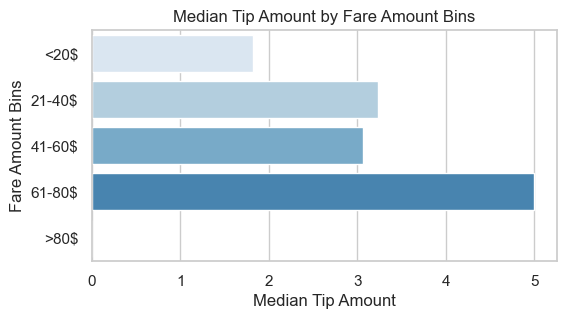

In [2680]:
# Create a bar plot
sns.set_style('whitegrid')

plt.figure(figsize=(6, 3))
sns.barplot(x="tip_amount", y="fare_amount_bins", data=grouped_df_fare_tip, palette="Blues")

# Set the x-axis label
plt.xlabel("Median Tip Amount")
plt.xticks()

# Set the y-axis label
plt.ylabel("Fare Amount Bins")

# Set the title
plt.title("Median Tip Amount by Fare Amount Bins")

plt.show()

In [2681]:
from scipy import stats

# Extract the tip amounts for each fare amount bins
tip_amounts_by_fare = [
    df[df["fare_amount_bins"] == bin_]["tip_amount"] for bin_ in grouped_df_fare_tip["fare_amount_bins"]]

# Perform Kruskal-Wallis test
statistic, pvalue = stats.kruskal(*tip_amounts_by_fare)

# Print the results
print("Kruskal-Wallis test results:")
print("Statistic:", statistic)
print("p-value:", pvalue)

# Interpret the results
alpha = 0.05
if pvalue < alpha:
    print("There is statistically significant difference in median tip amount among different fare amount bins.")
else:
    print("There is no statistically significant difference in median tip amount among different fare amount bins.")

Kruskal-Wallis test results:
Statistic: 2641.3802901795448
p-value: 0.0
There is statistically significant difference in median tip amount among different fare amount bins.


Berdasarkan data yang dimiliki dan pada tingkat signifikansi, ada perbedaan signifikan dalam tip_amount antara fare amount bins. Dengan kata lain, Fare Amount mempengaruhi besarnya tip_amount yang diberikan oleh pelanggan.



##### b. Tip terhadap Total Amount

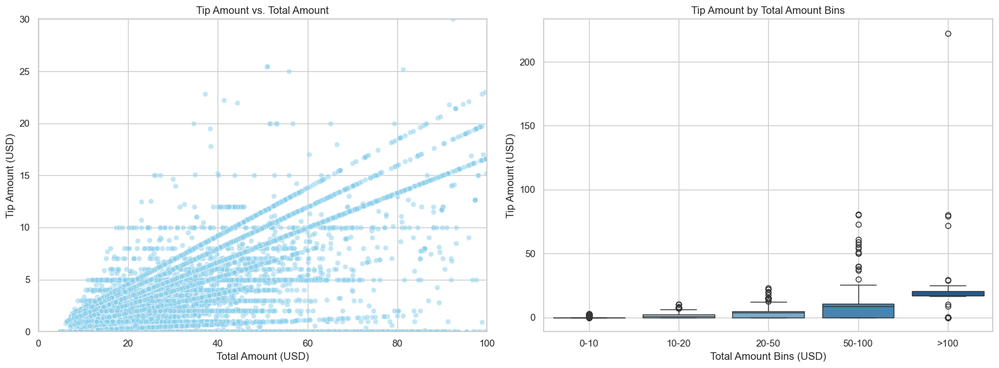

In [2682]:

fig, axes = plt.subplots(ncols=2, figsize=(16, 6))

sns.scatterplot(
    x='total_amount',
    y='tip_amount',
    data=df,
    alpha=0.5,
    color='skyblue',
    ax=axes[0]
)
axes[0].set_title('Tip Amount vs. Total Amount')
axes[0].set_xlabel('Total Amount (USD)')
axes[0].set_ylabel('Tip Amount (USD)')
axes[0].set_xlim(0, 100)
axes[0].set_ylim(0, 30)
axes[0].grid(True)

sns.boxplot(
    x=pd.cut(df['total_amount'], bins=[0, 10, 20, 50, 100, np.inf], labels=['0-10', '10-20', '20-50', '50-100', '>100']),
    y='tip_amount',
    data=df,
    ax=axes[1],
    palette='Blues'
)
axes[1].set_title('Tip Amount by Total Amount Bins')
axes[1].set_xlabel('Total Amount Bins (USD)')
axes[1].set_ylabel('Tip Amount (USD)')
axes[1].grid(True)

plt.tight_layout()
plt.show()

In [2683]:
spearman_corr = df[['tip_amount', 'total_amount']].corr(method='spearman').iloc[0, 1]
print(f"Pearson Correlation between Tip Amount and Total Amount: {spearman_corr:.2f}")

Pearson Correlation between Tip Amount and Total Amount: 0.49


In [2684]:
from scipy.stats import pearsonr
from scipy.stats import spearmanr

corr_stat, corr_pvalue = spearmanr(df['tip_amount'], df['total_amount'])
print(f"Pearson Correlation Test: Statistic={corr_stat:.2f}, p-value={corr_pvalue:.2f}")

# Interpretation
if corr_pvalue <= 0.05:
    print("Result: Tolak H0. Ada hubungan linear yang signifikan antara tip_amount dan total_amount.")
else:
    print("Result: Gagal tolak H0. Tidak ada hubungan linear yang signifikan antara tip_amount dan total_amount.")

Pearson Correlation Test: Statistic=0.49, p-value=0.00
Result: Tolak H0. Ada hubungan linear yang signifikan antara tip_amount dan total_amount.


berdasarkan visualisasi dari grafik serta berdasarkan uji korelasi, dapat disimpulkan bahwa kedua kolom memiliki keterkaitan, artinya bahwa saat total biaya perjalanan (total_amount) tinggi, biaya tip akan memiliki kecenderungan untuk meningkat.

##### c. Tip amount tethadap Day Category (peak days)

In [2685]:
daycat_tip_corr = df[df['tip_amount']>0][['day_category', 'tip_amount']]
ct_tip_daycat = daycat_tip_corr.groupby('day_category').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_daycat

,day_category,count,avg_tip,median_tip
0,Weekdays,27831,3.71,3.05
1,Weekend,9228,3.80,3.10


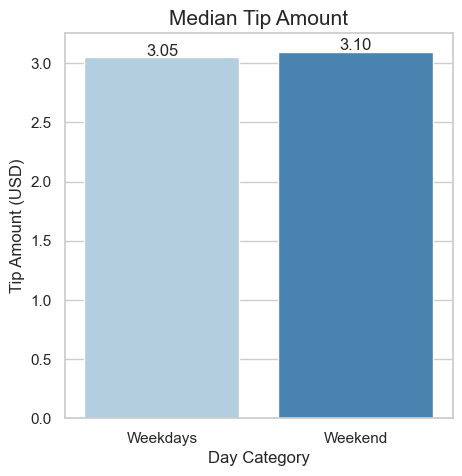

In [2686]:
plt.figure(figsize=(5,5))

bars = sns.barplot(data=ct_tip_daycat, x='day_category', y='median_tip', ci=0, palette='Blues')
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.01
    label = "{:.2f}".format(ct_tip_daycat['median_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Day Category')
plt.ylabel('Tip Amount (USD)')
plt.title('Median Tip Amount', fontsize=15)
plt.show()

In [2687]:
from scipy.stats import mannwhitneyu

stat, pvalue= mannwhitneyu(
    daycat_tip_corr[daycat_tip_corr['day_category'] == 'Weekend']['tip_amount'].sample(100, random_state=0),
    daycat_tip_corr[daycat_tip_corr['day_category'] == 'Weekdays']['tip_amount'].sample(100, random_state=0),
    alternative='two-sided'
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 0.6345005146604066
Terima H0


berdasarkan data yang dimiliki dan pada tingkat signifikansi, data memberikan bukti bahwa median dari nilai dari pemberian tip pada saat weekend cenderung bernilai sama dengan pemberian tip pada saat weekdays, dengan begitu tidak ada pengaruh signifkan untuk hari, jumlah pemberian tip identik.

##### c. Tip terhadap Trip Distance

In [2688]:
tip_distance = df[df['tip_amount']>0][['tip_amount', 'distance_bins']]
ct_tip_distance = tip_distance.groupby('distance_bins').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).reset_index().round(2)
ct_tip_distance

,distance_bins,count,avg_tip,median_tip
0,<2 miles,17415,2.51,2.44
1,3-6 miles,15737,4.08,4.00
2,7-10 miles,2940,6.88,7.14
3,>10 miles,967,10.66,10.56


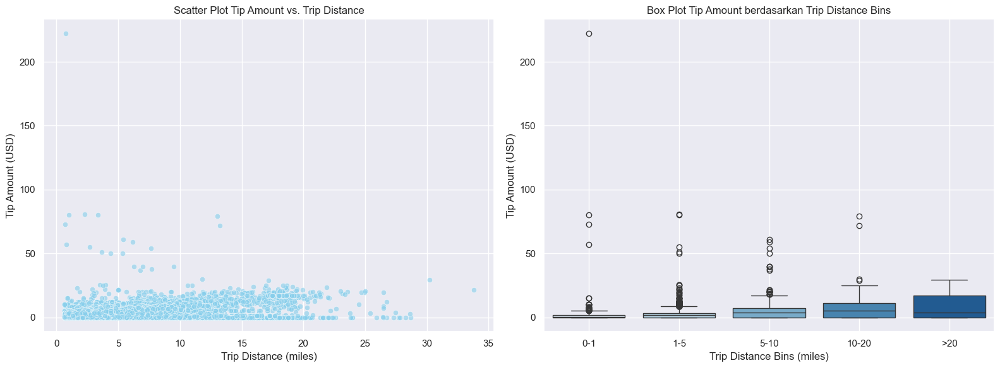

In [2689]:
sns.set(style="darkgrid")
fig, axes = plt.subplots(ncols=2, figsize=(16, 6))

sns.scatterplot(
    x='trip_distance',
    y='tip_amount',
    data=df,
    alpha=0.6,
    color='skyblue',
    ax=axes[0]
)
axes[0].set_title('Scatter Plot Tip Amount vs. Trip Distance')
axes[0].set_xlabel('Trip Distance (miles)')
axes[0].set_ylabel('Tip Amount (USD)')
axes[0].grid(True)

sns.boxplot(
    x=pd.cut(df['trip_distance'], bins=[0, 1, 5, 10, 20, np.inf], labels=['0-1', '1-5', '5-10', '10-20', '>20']),
    y='tip_amount',
    data=df,
    ax=axes[1],
    palette='Blues'
)
axes[1].set_title('Box Plot Tip Amount berdasarkan Trip Distance Bins')
axes[1].set_xlabel('Trip Distance Bins (miles)')
axes[1].set_ylabel('Tip Amount (USD)')
axes[1].grid(True)

plt.tight_layout()
plt.show()

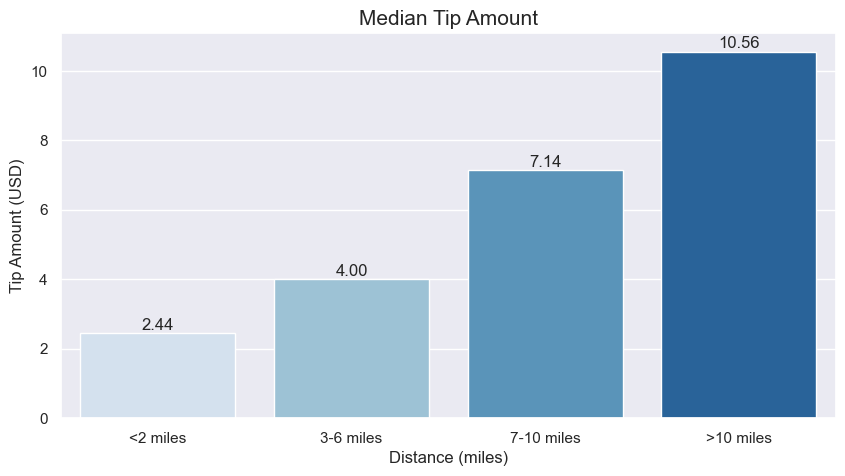

In [2690]:
plt.figure(figsize=(10,5))

bars = sns.barplot(data=ct_tip_distance, x='distance_bins', y='median_tip', ci=0, palette='Blues')
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.1
    label = "{:.2f}".format(ct_tip_distance['median_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Distance (miles)')
plt.ylabel('Tip Amount (USD)')
plt.title('Median Tip Amount', fontsize=15)
plt.show()


In [2691]:
from scipy.stats import kruskal

stat, pvalue= kruskal(
    tip_distance[tip_distance['distance_bins'] == '<2 miles']['tip_amount'].sample(100, random_state=0),
    tip_distance[tip_distance['distance_bins'] == '3-6 miles']['tip_amount'].sample(100, random_state=0),
    tip_distance[tip_distance['distance_bins'] == '7-10 miles']['tip_amount'].sample(100, random_state=0),
    tip_distance[tip_distance['distance_bins'] == '>10 miles']['tip_amount'].sample(100, random_state=0)
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 1.5900934247526733e-40
Tolak H0


berdasarkan hasil pengujian, terdapat hubungan signifikan antara jarak dan tip, terlihat saat jarak tempuh semakin jauh, pemberian tip cenderung meningkat.


##### e. Total Amount terhadap Fare Amount

In [2692]:
spearman_corr, spearman_pvalue = spearmanr(df['total_amount'], df['fare_amount'])
print(f"Spearman Correlation: {spearman_corr:.2f}, p-value: {spearman_pvalue:.2f}")

# Interpretasi hasil
if spearman_pvalue <= 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

Spearman Correlation: 0.94, p-value: 0.00
Terima H0


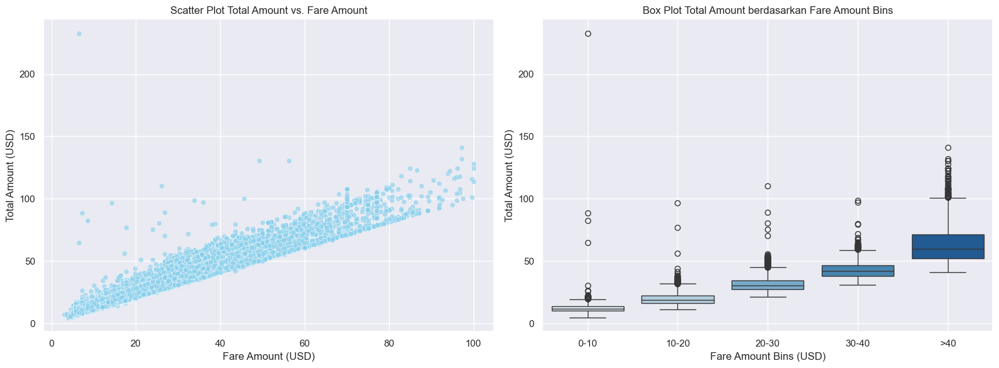

In [2693]:
fig, axes = plt.subplots(ncols=2, figsize=(16, 6))
sns.scatterplot(
    x='fare_amount',
    y='total_amount',
    data=df,
    alpha=0.6,
    color='skyblue',
    ax=axes[0],
)
axes[0].set_title('Scatter Plot Total Amount vs. Fare Amount')
axes[0].set_xlabel('Fare Amount (USD)')
axes[0].set_ylabel('Total Amount (USD)')
axes[0].grid(True)

sns.boxplot(
    x=pd.cut(df['fare_amount'], bins=[0, 10, 20, 30, 40, np.inf], labels=['0-10', '10-20', '20-30', '30-40', '>40']),
    y='total_amount',
    data=df,
    ax=axes[1],
    palette='Blues'
)
axes[1].set_title('Box Plot Total Amount berdasarkan Fare Amount Bins')
axes[1].set_xlabel('Fare Amount Bins (USD)')
axes[1].set_ylabel('Total Amount (USD)')
axes[1].grid(True)

plt.tight_layout()
plt.show()

berdasarkan hasil pengujian, tentu kedua kolom memiliki keterkaitan, antara total amount dan fare amount, semakin banyak pelanggan yang menggunakan jasa Taxi, semakin besar juga pendapatan totalnya

##### f. Tip Amount terhadap RatecodeID

In [2694]:
ratecode_tip_corr = df[df['tip_amount']>0][['RatecodeID', 'tip_amount']]
ct_tip_ratecode= ratecode_tip_corr.groupby('RatecodeID').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_ratecode

,RatecodeID,count,avg_tip,median_tip
0,JFK Airport,86,15.10,15.61
1,Nassau or Westchester,11,10.99,10.65
2,Negotiated fare,281,6.32,4.80
3,Newark Airport,5,10.16,5.30
4,Standard rate,36676,3.69,3.05


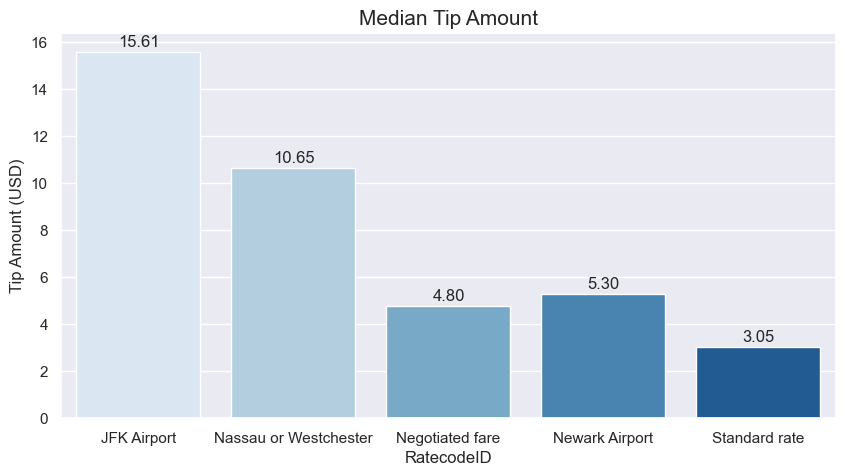

In [2695]:
plt.figure(figsize=(10,5))
sns.set(style="darkgrid")
bars = sns.barplot(data=ct_tip_ratecode, x='RatecodeID', y='median_tip', ci=0, palette='Blues')
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.2
    label = "{:.2f}".format(ct_tip_ratecode['median_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('RatecodeID')
plt.ylabel('Tip Amount (USD)')
plt.title('Median Tip Amount', fontsize=15)
plt.show()

In [2696]:
from scipy.stats import kruskal

stat, pvalue= kruskal(
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'Standard rate']['tip_amount'].sample(7, random_state=0),
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'JFK Airport']['tip_amount'].sample(7, random_state=0),
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'Negotiated fare']['tip_amount'].sample(7, random_state=0),
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'Nassau or Westchester']['tip_amount'].sample(7, random_state=0),
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

print(f"Warning: 'Newark Airport'. Sample data kurang.")

p-Value 0.025052501982105357
Tolak H0


### 4.3 Pick Up Frequencies

In [2720]:

pickup_counts = df['DOBorough'].value_counts()

top_doborough = pickup_counts.index.tolist()

top_dozone_in_doborough = df[df['DOBorough'].isin(top_doborough)].groupby('DOBorough')['DOZone'].agg(lambda x: x.value_counts().index[0]).to_dict()
NYC_geojson = 'nyc-zip-code-tabulation-areas-polygons.geojson'
borough_coords = {
    'Manhattan': (40.7831, -73.9712),
    'Brooklyn': (40.6782, -73.9442),
    'Queens': (40.7282, -73.7949),
    'Bronx': (40.8448, -73.8648),
    'Staten Island': (40.5795, -74.1502),
    'EWR': (40.6895, -74.1745)
}

nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11, tiles='CartoDB positron')

for borough in top_doborough:
    if borough in borough_coords:
        folium.Marker(
            location=borough_coords[borough],
            popup=f"{borough}: {pickup_counts[borough]} pickups",
            icon=folium.Icon(color='red', icon='info-sign')
        ).add_to(nyc_map)

ewr_pickups = df[df['DOZone'] == 'Newark Airport']['DOZone'].count()
folium.Marker(
    location=borough_coords['EWR'],
    popup=f"Newark Airport (EWR): {ewr_pickups} pickups",
    icon=folium.Icon(color='blue', icon='plane')
).add_to(nyc_map)

nyc_map


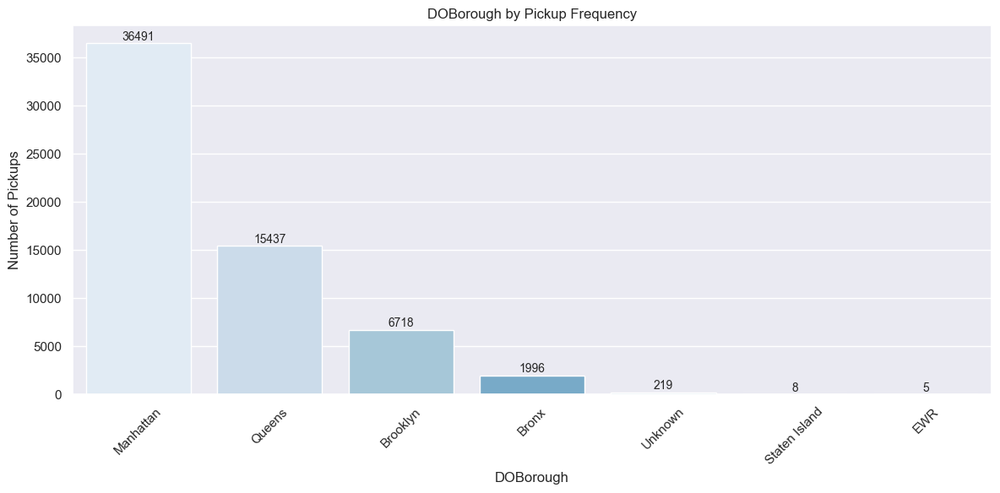

In [2698]:
doborough_counts = df['DOBorough'].value_counts()

plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=doborough_counts.index,
    y=doborough_counts.values,
    palette='Blues'
)
plt.title('DOBorough by Pickup Frequency')
plt.xlabel('DOBorough')
plt.ylabel('Number of Pickups')
plt.xticks(rotation=45)
for index, value in enumerate(doborough_counts.values):
    ax.text(index, value + 50, f'{value}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


Peta diatas menunjukan pickup zone paling banyak berada di borough Manhattan dengan 36491 kali pada januari 2023, sedangkan EWR terdapat 5, EWR dan kategori unknown tidak dapat di deskripsikan dikarenakan tidak terdapat keterangan tempat didalam dataset.

### 4.4 Analisis Permintaan Pelanggan

Pada bagian analisis permintaan pelanggan akan diketahui waktu tertentu permintaan tertinggi, selain itu dapat mengetahui jam sibuk serta pola lain sebagai dasar pengetahuan.

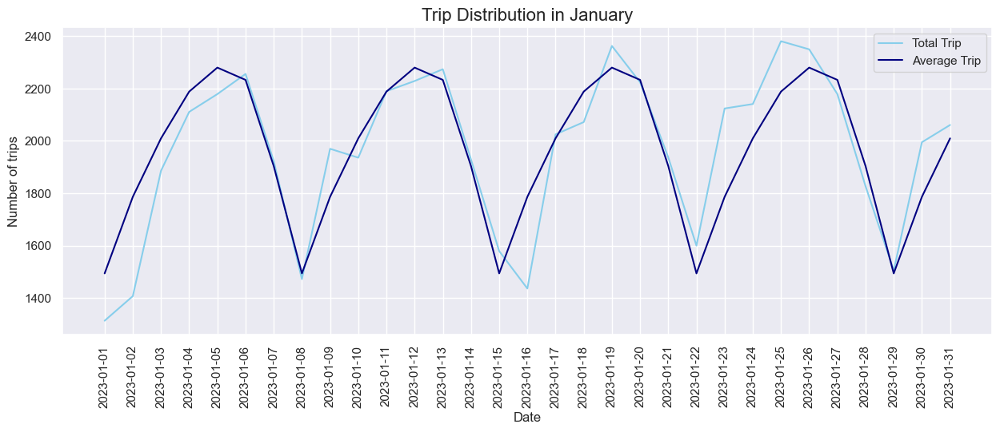

In [2699]:
trip_monthly = df.groupby(df['lpep_pickup_datetime'].dt.date).agg(trip_bydate=('lpep_pickup_datetime', 'count')).reset_index()
trip_monthly['lpep_pickup_datetime'] = pd.to_datetime(trip_monthly['lpep_pickup_datetime'])
trip_monthly['day_of_week'] = trip_monthly['lpep_pickup_datetime'].dt.day_name()

trip_dayly = trip_monthly.groupby('day_of_week').agg(trip_byday=('trip_bydate', 'sum'), day_count=('day_of_week', 'count'), avg_trip=('trip_bydate', 'mean')).reset_index()
trip_dayly['day_cat']= trip_dayly['day_of_week'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekdays')

trip_dayly_cat = trip_dayly.groupby('day_cat').agg(trip_bycat=('trip_byday', 'sum')).reset_index()

trip_merge = pd.merge(trip_monthly, trip_dayly, on='day_of_week', how='left')
trip_merge = pd.merge(trip_merge, trip_dayly_cat, on='day_cat', how='left')

plt.figure(figsize=(15,5))
sns.set_style('darkgrid')

sns.lineplot(data=trip_merge,
             x='lpep_pickup_datetime', 
             y='trip_bydate', 
             color='skyblue',
             label = 'Total Trip')

sns.lineplot(data=trip_merge,
             x='lpep_pickup_datetime', 
             y='avg_trip',
             color='navy',
             label = 'Average Trip')

plt.title('Trip Distribution in January', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Number of trips')
plt.xticks(trip_monthly['lpep_pickup_datetime'], rotation=90)
plt.show()


grafik diatas menunjukan total Demand pada bulan januari 2023.

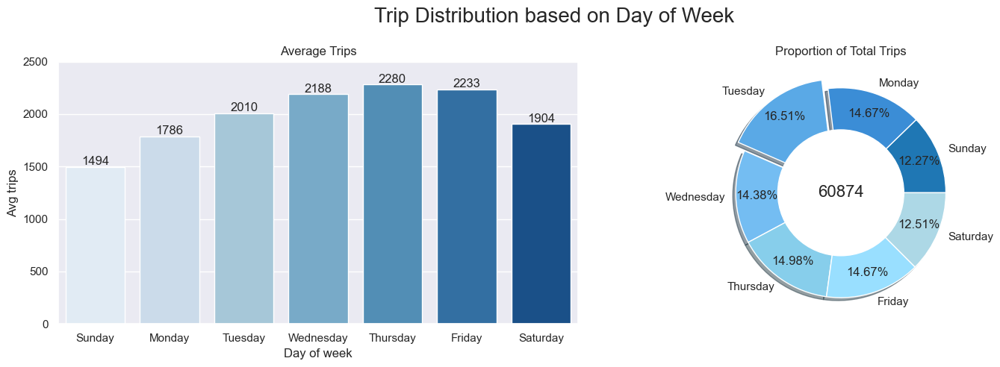

In [2700]:
plt.figure(figsize=(15,5))

plt.suptitle('Trip Distribution based on Day of Week', fontsize=20)
plt.subplot(1,2,1)
bars = sns.barplot(x=trip_merge['day_of_week'].unique().tolist(), 
                   y=trip_merge['avg_trip'].unique().tolist(), 
                   palette='Blues')
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 20
    label = "{:.0f}".format(trip_merge['avg_trip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.title('Average Trips')
plt.xlabel('Day of week')
plt.ylabel('Avg trips')
plt.yticks(np.arange(0, 2501, 500))

blue_colors = ['#1f77b4', '#3b8dd6', '#5aa9e6', '#74bdf2', '#87ceeb', '#99dfff', '#add8e6', '#bfefff']
plt.subplot(1,2,2)
plt.pie(x=trip_merge['trip_byday'].unique().tolist(), 
        labels=trip_merge['day_of_week'].unique().tolist(), 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0,0,0.1,0,0,0,0),
        shadow=True,
        colors=blue_colors
)

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)
plt.text(0, 0, trip_merge['trip_byday'].unique().sum(), ha='center', va='center', fontsize=16)
plt.title('Proportion of Total Trips')

plt.tight_layout()
plt.show()

Trip Distribution based on Day week mengetahui jumlah penumpang setiap harinya.

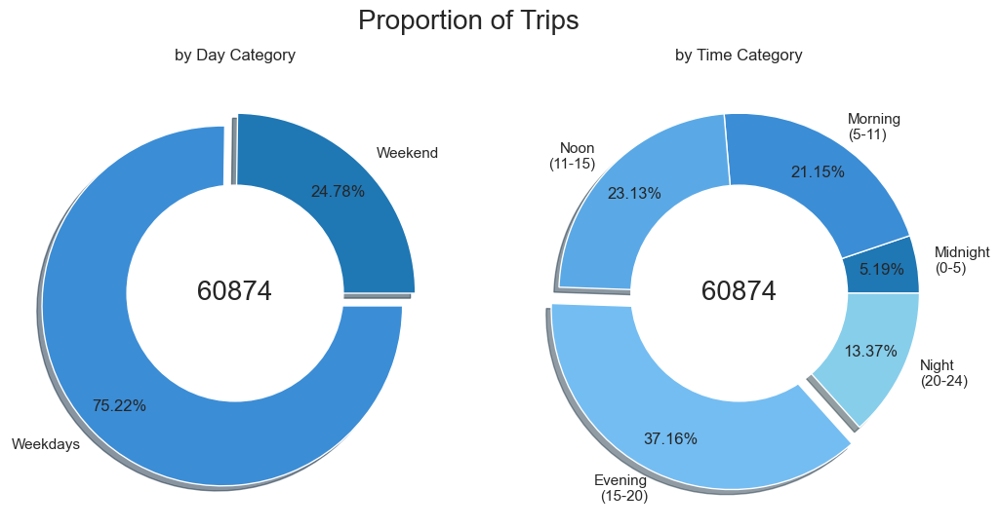

In [2701]:
trip_hourly = df.groupby([df['lpep_pickup_datetime'].dt.hour, 'pickup_time']).agg(trip_byhour=('lpep_pickup_datetime', 'count')).reset_index()
trip_bytimecat = df.groupby('pickup_time').agg(trip_bytime=('pickup_time', 'count')).reset_index()
trip_time_merge = pd.merge(trip_hourly, trip_bytimecat, on='pickup_time', how='left')

plt.figure(figsize=(15,6))
plt.suptitle('Proportion of Trips', fontsize=20)

plt.subplot(1,2,1)
blue_colors = ['#1f77b4', '#3b8dd6', '#5aa9e6', '#74bdf2', '#87ceeb', '#99dfff', '#add8e6', '#bfefff']
plt.pie(x=trip_merge['trip_bycat'].unique().tolist(), 
        labels=trip_merge['day_cat'].unique().tolist(), 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0,0.1), 
        shadow=True,
        colors=blue_colors
        )

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)

plt.text(0, 0, trip_merge['trip_bydate'].sum(), ha='center', va='center', fontsize=20)
plt.title('by Day Category')

plt.subplot(1,2,2)

labels = [f"{trip_time_merge['pickup_time'].unique().tolist()[0]}\n(0-5)",
          f"{trip_time_merge['pickup_time'].unique().tolist()[1]}\n(5-11)",
          f"{trip_time_merge['pickup_time'].unique().tolist()[2]}\n(11-15)",
          f"{trip_time_merge['pickup_time'].unique().tolist()[3]}\n(15-20)",
          f"{trip_time_merge['pickup_time'].unique().tolist()[4]}\n(20-24)"]

plt.pie(x=trip_time_merge['trip_bytime'].unique().tolist(), 
        labels=labels, 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0,0,0,0.1,0),
        shadow=True,
        colors=blue_colors
        )

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)

plt.text(0, 0, trip_time_merge['trip_byhour'].sum(), ha='center', va='center', fontsize=20)
plt.title('by Time Category')

plt.subplots_adjust(wspace=-0.2) 
plt.show()

Proportion of Trips menunjukan seberapa besar antara hari kerja dan akhir pekan besaran penumpangnya, serta jumlah penumpang setiap kategori waktu.

In [2702]:
day_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
cross = pd.crosstab(index=df['lpep_pickup_datetime'].dt.day_name(), columns=df['lpep_pickup_datetime'].dt.hour, margins=True).reindex(day_order)
cross.columns.name = None
cross.index.name = 'Day of Week'

melted_cross = cross.iloc[:,:-1].reset_index().melt(id_vars='Day of Week', var_name='hour', value_name='trips')
cross

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,All
Day of Week,,,,,,,,,,,,,,,,,,,,,
Sunday,281,264,222,181,137,74,59,97,123,217,...,564,539,506,518,443,379,295,193,158,7469
Monday,112,69,50,62,50,51,136,378,420,487,...,697,704,709,727,551,382,308,219,152,8932
Tuesday,85,52,44,36,21,51,187,533,649,647,...,721,785,777,800,629,456,324,242,166,10049
Wednesday,85,68,27,26,17,43,166,408,512,520,...,652,693,747,735,606,409,280,211,155,8754
Thursday,89,61,41,26,31,51,161,427,505,544,...,661,699,761,795,543,444,312,241,168,9121
Friday,137,81,39,36,28,42,141,430,466,468,...,697,691,711,721,568,421,323,290,251,8933
Saturday,211,176,126,103,84,45,46,111,196,252,...,581,569,514,533,476,419,324,316,302,7616


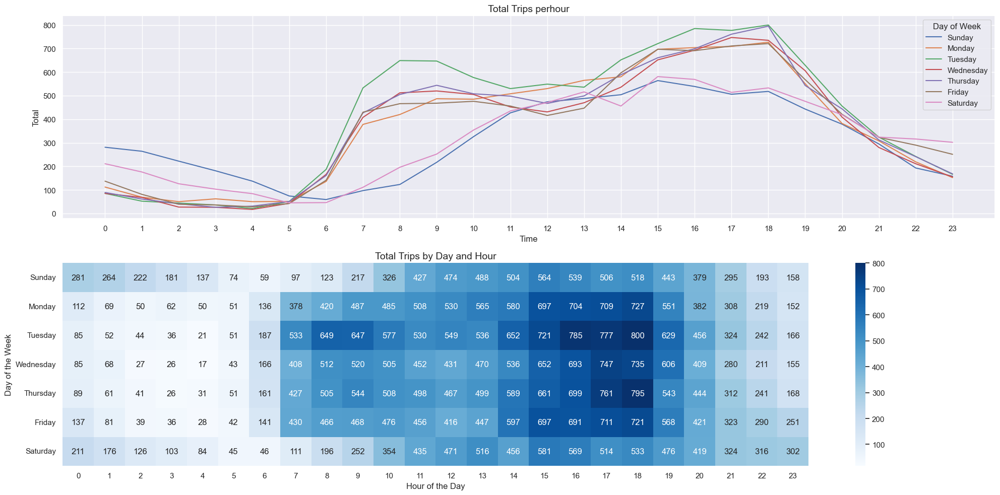

In [2703]:
plt.figure(figsize=(20,10))

plt.subplot(2, 1, 1)
sns.lineplot(data=melted_cross, 
             x='hour', 
             y='trips', 
             hue='Day of Week', 
            )

plt.title('Total Trips perhour', fontsize=14)
plt.xlabel('Time')
plt.xticks(np.arange(0,24,1))
plt.ylabel('Total')

plt.subplot(2, 1, 2)
sns.heatmap(cross.iloc[:,:-1], cmap="Blues", annot=True, fmt='d')
plt.title('Total Trips by Day and Hour', fontsize=14)
plt.xlabel('Hour of the Day')
plt.ylabel('Day of the Week')

plt.tight_layout()
plt.show()

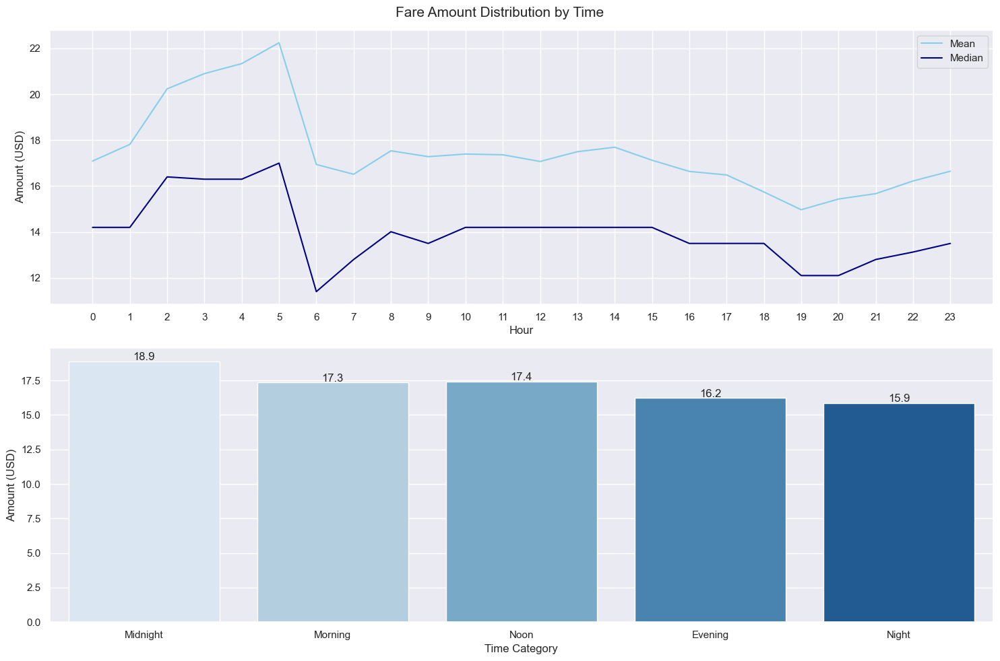

In [2704]:
sort_time = ['Midnight', 'Morning', 'Noon', 'Evening', 'Night']
amount_by_hour = df.groupby(df['lpep_pickup_datetime'].dt.hour).agg(total_fare_amount=('fare_amount', 'sum'), 
                                                                    avg_fare_amount=('fare_amount', 'mean'), 
                                                                    median_fare_amount=('fare_amount', 'median')).reset_index()
amount_by_time = df.groupby('pickup_time').agg(total_fare_amount=('fare_amount', 'sum'), 
                                               avg_fare_amount=('fare_amount', 'mean'), 
                                               median_fare_amount=('fare_amount', 'median')).reindex(sort_time).reset_index().round(2)

plt.figure(figsize=(15,10))
plt.suptitle('Fare Amount Distribution by Time', fontsize=15)

plt.subplot(2,1,1)
sns.set_style('darkgrid')
sns.lineplot(data=amount_by_hour,  
             x='lpep_pickup_datetime', 
             y='avg_fare_amount', 
             color='skyblue',
             label = 'Mean',
             )
sns.lineplot(data=amount_by_hour, 
             x='lpep_pickup_datetime', 
             y='median_fare_amount', 
             color='navy',
             label = 'Median',
             )
plt.xlabel('Hour')
plt.xticks(np.arange(0,24,1))
plt.ylabel('Amount (USD)')


plt.subplot(2,1,2)
bars = sns.barplot(data=amount_by_time,
                   x='pickup_time', 
                   y='avg_fare_amount',
                   palette='Blues',
                   )

for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.3
    label = "{:.1f}".format(amount_by_time['avg_fare_amount'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center', va='center')
plt.xlabel('Time Category')
plt.ylabel('Amount (USD)')

plt.tight_layout()
plt.show()

grafik diatas menunjukan Fare amount berdasarkan satuan waktunya.

In [2718]:
import plotly.express as px

puzone_amount = df.groupby(['DOBorough', 'DOZone']).agg(trip_count=('fare_amount', 'count'), 
                                                        total_fare_amount=('fare_amount', 'sum'),
                                                        avg_fare_amount=('fare_amount', 'mean'),
                                                        median_fare_amount=('fare_amount', 'median')
                                                        ).sort_values(by='total_fare_amount', ascending=False).reset_index().round(2)

fig = px.treemap(puzone_amount, 
                 path=[px.Constant("All"), 'DOBorough', 'DOZone'], 
                 values='total_fare_amount', 
                 color='median_fare_amount',
                 color_continuous_scale='Blues',
                 range_color=[5, 40],
                 custom_data=['trip_count', 'median_fare_amount'],
                 title='Heatmap for Average fare amount based on Drop off Location')
fig.update_traces(hovertemplate='<b>%{label}</b><br>Total Fare: %{value}<br>Trip Count: %{customdata[0]}<br>Median Fare: %{customdata[1]:.2f}')
fig.update_layout(margin = dict(t=50, l=0, r=0, b=0))
fig.update_traces(marker=dict(cornerradius=2))
fig.show()

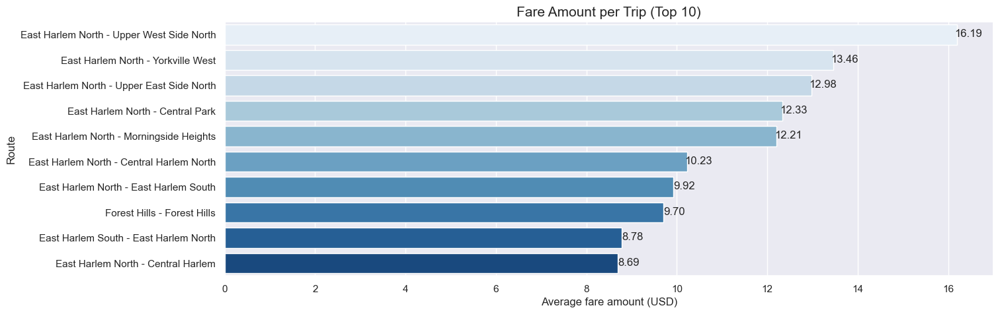

In [2706]:
trip_amount_dist = df.groupby(['PUZone', 'DOZone']).agg(trip_count=('PUZone', 'count'),
                                                        total_fare=('fare_amount', 'sum'), 
                                                        avg_fare=('fare_amount', 'mean'),
                                                        total_tip=('tip_amount', 'sum'), 
                                                        avg_tip=('tip_amount', 'mean')).reset_index().sort_values(by=['trip_count'], ascending=False).head(10).round(2)
route = trip_amount_dist['PUZone'] + " - " + trip_amount_dist['DOZone']
trip_amount_dist.insert(0, 'Route', route)
trip_amount_dist.drop(columns=['PUZone', 'DOZone'], inplace=True)

plt.figure(figsize=(15,5))
data = trip_amount_dist.sort_values(by='avg_fare', ascending=False)
bars = sns.barplot(data=data,
                   y='Route', 
                   x='avg_fare', 
                   palette='Blues')
for idx, bar in enumerate(bars.patches):
    y_value = bar.get_y() + bar.get_height() / 1.6
    x_value = bar.get_width() + 0.25
    label = "{:.2f}".format(data['avg_fare'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')
plt.xlabel('Average fare amount (USD)')
plt.ylabel('Route')
plt.title('Fare Amount per Trip (Top 10)', fontsize=15)

plt.show()

---

# 5. Conclusion

1. Berdasarkan Geografisnya, Manhattan dan Queens menjadi *borough* yang paling banyak *demand* atau permintaan layanan jasa taxi, indikasi tersebut menjadi patokan sebagai area yang paling banyak aktivitas.

2. Berdasarkan kategori mingguannya *Weekdays* lebih memiliki banyak *Demand* dibandingkan akhir pekan (*weekend*), untuk hari dalam seminggu cenderung memiliki penumpang yang merata setiap harinya, dalam satuan jam, pagi dan sore memiliki kepadatan yang jauh lebih sibuk dibandingkan siang dan malam hari, hal ini menyesuaikan dengan jam kerja.

3. Berdasarkan Frekuensi perjalanan, dikarenakan New York merupakan kota metropolis dengan kepadatan yang tinggi, maka perjalanan cenderung lebih singkat.

4. Berdasarkan Tip, perjalanan jauh cenderung mendapatkan tip yang lebih banyak.

---

# 6. Recommendation

1. Melihat berdasarkan *peak hours* serta kepadatan *demand* pada area *Queens* dan *Manhattan*, kedua area tersebut perlu dilakukan optimasi terutama pada jam sibuk, penambahan armada agar taxi selalu dalam jumlah yang cukup sesuai permintaan pelanggan diperlukan agar operasional bisa berjalan lancar tanpa hambatan, serta pelatihan kepada pengemudi mengenai rute baru atau jalan *shortcut* yang belum tereksplorasi.

2. Perlu diadakan diskon atau promosi potongan harga contohnya pada saat *weekend*, serta memiliki aplikasi yang sudah terafiliasi, dalam aplikasi tersebut jika penumpang dinilai loyal, maka penawaran promosi tersebut dirasa tidak akan merugikan.

3. Dalam pengembangan dataset, pencatatan waktu ril secara aktual perlu dicatat oleh driver diteruskan kepada perusahaan agar mendapatkan data yang lebih baik untuk dianalisa.

---